In [1]:
import numpy
import numpy as np
import time
import datetime
import netCDF4
import matplotlib.pylab as plt
import os,sys,glob
sys.path.append(os.getcwd()+'/../adjust/rasotools/')
from utils import *
from multiprocessing import Pool
#import odb
from eccodes import *
from functools import partial
from collections import OrderedDict
import subprocess
import json
import gzip
# from retrieve_fb_jra55 import add_feedback
import copy
import pickle

import pandas as pd
import matplotlib.pylab as plt
import matplotlib.pyplot as maplt

plt.rcParams['lines.linewidth'] = 3

import warnings
warnings.filterwarnings('ignore')

In [2]:
eccodes.codes_bufr_keys_iterator_delete

<function gribapi.gribapi.codes_bufr_keys_iterator_delete(iterid)>

In [3]:
from sklearn.ensemble import RandomForestRegressor
from sklearn.datasets import make_regression
from sklearn.model_selection import train_test_split

from sklearn.tree import DecisionTreeRegressor

# from keras.models import Sequential
# from keras.layers import Dense
# from keras.layers import LSTM
model_rf = RandomForestRegressor(max_depth=10, 
                                 random_state=0,
                                 bootstrap=True,
                                 max_samples=0.965,
                             )

model_dt = DecisionTreeRegressor(max_depth=10)

In [4]:
def calc_height(t, p, jump = False):
    '''
    isotherm height formular
    z = -R*t0/g * ln(p/p0)
    z = -287.053*t0/9.80665 * ln(p/p0)
    
    polytrop height forumular
    z = t0/L * ((p/p0)**(-L*R/g) -1)
    L = −0.0065 K/m
    R = 287.053 J/(kg K)
    g = 9.80665 m/s2
    z = t0/−0.0065 * ((p/p0)**(0.0065*287.053/9.80665) -1)
    
    international height formular
    z = 288.15/0.0065 * (1- (p/1013.25)**(1/5.255))
    
    '''
    # from: https://www.cesm.ucar.edu/models/cesm1.1/cesm/cesmBbrowser/html_code/cam/tropopause.F90.html
    SHR_CONST_AVOGAD  = 6.02214e26
    SHR_CONST_BOLTZ   = 1.38065e-23
    SHR_CONST_MWDAIR  = 28.966
    SHR_CONST_RGAS    = SHR_CONST_AVOGAD*SHR_CONST_BOLTZ
    SHR_CONST_RDAIR   = SHR_CONST_RGAS/SHR_CONST_MWDAIR
    rair = SHR_CONST_RDAIR

    SHR_CONST_G       = 9.80616
    gravit = SHR_CONST_G

    SHR_CONST_CPDAIR  = 1.00464e3
    cappa        = (SHR_CONST_RGAS/SHR_CONST_MWDAIR)/SHR_CONST_CPDAIR
    cnst_kap = cappa

    cnst_faktor = -gravit/rair
    cnst_ka1    = cnst_kap - 1.
        
    z = []
    for i in range(len(t)):
        
        if i == 0:
            L = -0.0065
            height = t[i]/L * ((p[i]/101325)**(-L*287.053/9.80665) -1)
            z.append(height)
        else:
            if jump:
                if z[i-1] < 11000:
                    L = -0.0065
                else:
                    L = -0.001
            else:                    
                # dt/dz
                pmk= .5 * (p[i-1]**cnst_kap+p[i]**cnst_kap)
                pm = pmk**(1/cnst_kap)               
                a = (t[i-1]-t[i])/(p[i-1]**cnst_kap-p[i]**cnst_kap)
                b = t[i]-(a*p[i]**cnst_kap)
                tm = a * pmk + b               
                dtdp = a * cnst_kap * (pm**cnst_ka1)
                L = cnst_faktor*dtdp*pm/tm # dtdz
#                 if not ((L < 0.05) and (L > -0.05)):
#                     L = -0.0065
                if L == 0:
                    L = -0.001

            height = t[i-1]/L * ((p[i]/p[i-1])**(-L*287.053/9.80665) -1)
            if np.isnan(height):
                print('p: ', p[i])
                print('p-1: ', p[i-1])
                print('t: ', t[i])
                print('t-1: ', t[i-1])
                print('L: ', L)
                z.append(z[-1])
            else:
                z.append(z[-1] + height)
    return z




        

# to gpm
from scipy.integrate import quad

def integrand(x):
    return (6371000 / (6371000 + x))**2
def expint(x):
    return quad(integrand, 0, x,)[0]


In [5]:
def haversine(lon1, lat1, lon2, lat2):
    """
    Calculate the great circle distance in kilometers between two points 
    on the earth (specified in decimal degrees)
    """
    # convert decimal degrees to radians 
    lon1 = numpy.radians(lon1)
    lat1 = numpy.radians(lat1)
    lon2 = numpy.radians(lon2)
    lat2 = numpy.radians(lat2)

    # haversine formula 
    dlon = lon2 - lon1 
    dlat = lat2 - lat1 
    a = np.sin(dlat/2)**2 + np.cos(lat1) * np.cos(lat2) * np.sin(dlon/2)**2
    c = 2 * np.arcsin(np.sqrt(a)) 
    r = 6371 # Radius of earth in kilometers. Use 3956 for miles. Determines return value units.
    return c * r

In [6]:
def inverse_haversine(lat, lon, distance, direction):
    '''
    distance: [km]
    '''
    lat = numpy.radians(lat)
    lon = numpy.radians(lon)
    d = numpy.array(distance)
    r = 6371 #[km]
    if direction == "NORTH":
        brng = np.radians(180.)
    elif direction == "EAST":
        brng = np.radians(270.)
    else:
        return "error - not a valid direction"
    return_lat = numpy.arcsin(numpy.sin(lat) * numpy.cos(d / r) + numpy.cos(lat) * numpy.sin(d / r) * numpy.cos(brng))
    return_lon = lon + numpy.arctan2(numpy.sin(brng) * numpy.sin(d / r) * numpy.cos(lat), numpy.cos(d / r) - numpy.sin(lat) * numpy.sin(return_lat))

    return numpy.degrees(return_lat), numpy.degrees(return_lon)

In [7]:
# from haversine import inverse_haversine, Direction
def transport(lat, lon, u_dist, v_dist):
    '''
    dist: [km]
    '''
    new_lat, new_lon = inverse_haversine(lat, lon, u_dist, "EAST")
    new_lat, new_lon = inverse_haversine(new_lat, new_lon, v_dist, "NORTH")
    return new_lat, new_lon

In [8]:
# def trajectory(lat, lon, u, v, pressure, temperature, w_rs = 5.0, wind = 'mean', factor = 1, u_factor = None, v_factor = None, z_variant = 'jump'):
#     '''
#     w_rs -> radio sonde rising speed
#     '''
#     if ((u_factor == None) and (v_factor == None)):
#         u_factor = factor
#         v_factor = factor
    
#     if z_variant == 'jump':
#         z = calc_height(temperature, pressure, jump = True) # m from K and Pa
#     elif z_variant == 'ucar': 
#         z = calc_height(temperature, pressure, jump = False) # m from K and Pa
# #     print(temperature, pressure)
# #     vec_expint = numpy.vectorize(expint)
# #     z = vec_expint(z)
    
#     lat_displacement = [0.]
#     lon_displacement = [0.]
    
#     for i in range(len(z)):
#         if i == 0:
#             new_lat = lat
#             new_lon = lon
#         else:
#             rising_time = (z[i]-z[i-1]) / w_rs
# #             print(z[i], z[i-1], z[i]-z[i-1], rising_time)
#             status = 400
# #             match wind:
# #                 case 'mean':
# #                     new_lat, new_lon = transport(new_lat, new_lon, (np.mean([u[i],u[i-1]]) * rising_time)/1000., (np.mean([v[i],v[i-1]]) * rising_time)/1000.)
# #                 case 'upper':
# #                     new_lat, new_lon = transport(new_lat, new_lon, (u[i] * rising_time)/1000., (v[i] * rising_time)/1000.)
# #                 case 'lower':
# #                     new_lat, new_lon = transport(new_lat, new_lon, (u[i-1] * rising_time)/1000., (v[i-1] * rising_time)/1000.) 
# #                 case _:
# #                     print('error: not a valid wind request')
#             if wind == 'mean':
#                 new_lat, new_lon = transport(new_lat, new_lon, (np.mean([u[i],u[i-1]]) * rising_time)/1000. * u_factor, (np.mean([v[i],v[i-1]]) * rising_time)/1000. * v_factor)
#             elif wind == 'upper':
#                 new_lat, new_lon = transport(new_lat, new_lon, (u[i] * rising_time)/1000. * u_factor, (v[i] * rising_time)/1000. * v_factor)
#             elif wind == 'lower':
#                 new_lat, new_lon = transport(new_lat, new_lon, (u[i-1] * rising_time)/1000. * u_factor, (v[i-1] * rising_time)/1000. * v_factor) 
#             else:
#                 print('error: not a valid wind request')


            
#             lat_displacement.append(lon - new_lon)
#             lon_displacement.append(lat - new_lat)
# #         lat_displacement.append(new_lat)
# #         lon_displacement.append(new_lon)

#     return lat_displacement, lon_displacement


In [9]:
def trajectory(lat, lon, u, v, pressure, temperature, w_rs = 5.0, wind = 'mean', factor = 1, u_factor = None, v_factor = None, z_variant = 'jump'):
    '''
    w_rs -> radio sonde rising speed
    '''
    if ((u_factor == None) and (v_factor == None)):
        u_factor = factor
        v_factor = factor
    
    if z_variant == 'jump':
        z = calc_height(temperature, pressure, jump = True) # m from K and Pa
    elif z_variant == 'ucar': 
        z = calc_height(temperature, pressure, jump = False) # m from K and Pa
#     print(temperature, pressure)
#     vec_expint = numpy.vectorize(expint)
#     z = vec_expint(z)
    
    lat_displacement = [0.]
    lon_displacement = [0.]
    
    u_shear=[0.]
    v_shear=[0.]
    
    for i in range(len(z)):
        if i == 0:
            new_lat = lat
            new_lon = lon
        else:
            rising_time = (z[i]-z[i-1]) / w_rs
#             print(z[i], z[i-1], z[i]-z[i-1], rising_time)
#             match wind:
#                 case 'mean':
#                     new_lat, new_lon = transport(new_lat, new_lon, (np.mean([u[i],u[i-1]]) * rising_time)/1000., (np.mean([v[i],v[i-1]]) * rising_time)/1000.)
#                 case 'upper':
#                     new_lat, new_lon = transport(new_lat, new_lon, (u[i] * rising_time)/1000., (v[i] * rising_time)/1000.)
#                 case 'lower':
#                     new_lat, new_lon = transport(new_lat, new_lon, (u[i-1] * rising_time)/1000., (v[i-1] * rising_time)/1000.) 
#                 case _:
#                     print('error: not a valid wind request')
            u_shear.append(u[i]-u[i-1])
            v_shear.append(v[i]-v[i-1])
            if (u_factor != 1) and (v_factor != 1):
                u_factor = 1 +(u[i]-u[i-1])
                v_factor = 1 +(v[i]-v[i-1])

            if wind == 'mean':
                new_lat, new_lon = transport(new_lat, new_lon, (np.mean([u[i],u[i-1]]) * rising_time)/1000. * u_factor, (np.mean([v[i],v[i-1]]) * rising_time)/1000. * v_factor)
            elif wind == 'upper':
                new_lat, new_lon = transport(new_lat, new_lon, (u[i] * rising_time)/1000. * u_factor, (v[i] * rising_time)/1000. * v_factor)
            elif wind == 'lower':
                new_lat, new_lon = transport(new_lat, new_lon, (u[i-1] * rising_time)/1000. * u_factor, (v[i-1] * rising_time)/1000. * v_factor) 
            else:
                print('error: not a valid wind request')


            
            lat_displacement.append(lat - new_lat)
            lon_displacement.append(lon - new_lon)
#         lat_displacement.append(new_lat)
#         lon_displacement.append(new_lon)

    return lat_displacement, lon_displacement, np.array(u_shear), np.array(v_shear)


---
---
---

# Different factors for wind to distance calculation - different for u and v

In [10]:
def par_read_bufr_stn_nofeedback(varno,bufrfile):
    alldata=''
    alldict=dict()

    bufrlist=[]
    tx=time.time()
#     try:
    f = open(bufrfile)
    print(f)
    cnt = 0
    output = {}
    # loop over the messages in the file
    bc = 0
    
    df={}
    df['temperature']=[]
    df['pressure']=[]
    df['u']=[]
    df['v']=[]
    df['latd']=[]
    df['lond']=[]
    df['lat']=[]
    df['lon']=[]
    df['calc_latd']=[]
    df['calc_lond']=[]
    df['z']=[]
    df['u_shear'] = []
    df['v_shear'] = []
    df['date'] = []
    df['time'] = []
    df['statid'] = []
    df['blockNumber'] = []
        
    
    rmse_total_lat = []
    rmse_total_lon = []
    rmse_total_lat_1 = []
    rmse_total_lon_1 = []
    
    rmse_sum_lon_1={}
    rmse_sum_lat_1={}
    rmse_sum_lon_2={}
    rmse_sum_lat_2={}
    rms_sum_lon_0={}
    rms_sum_lat_0={}

#     rms_sum_lon_1={}
#     rms_sum_lat_1={}
#     rms_sum_lon_2={}
#     rms_sum_lat_2={}
    stdplevs = [100000,92500,85000,70000,50000,40000,30000,25000,20000,15000,10000,7000,5000,3000,2000,1000]

    for i in stdplevs:
        rmse_sum_lon_1[i] = []
        rmse_sum_lat_1[i] = []
        rmse_sum_lon_2[i] = []
        rmse_sum_lat_2[i] = []
        rms_sum_lon_0[i] = []
        rms_sum_lat_0[i] = []
#         rms_sum_lon_1[i] = []
#         rms_sum_lat_1[i] = []
#         rms_sum_lon_2[i] = []
#         rms_sum_lat_2[i] = []
        
    while 1:
        try:
            # get handle for message
            bufr = codes_bufr_new_from_file(f)
            if bufr is None:
                break
            # we need to instruct ecCodes to expand all the descriptors
            # i.e. unpack the data section
    #         print (codes_get_array(bufr,'dataSubCategory'))
            if codes_get_array(bufr,'dataSubCategory')[0]!=109:
    #             print('not 109')
                codes_release(bufr)
                continue
            codes_set(bufr, 'unpack', 1)
            # get all the timePeriods
            iterid = codes_bufr_keys_iterator_new(bufr)

            hires=False
            while codes_bufr_keys_iterator_next(iterid):

    #             print key name
                keyname = codes_bufr_keys_iterator_get_name(iterid)
        
                if 'latitudeDisplacement' in keyname:
                    hires=True
            
            if not hires:
                codes_bufr_keys_iterator_delete(iterid)
                codes_release(bufr)
                continue
            ## delete the key iterator
            codes_bufr_keys_iterator_delete(iterid)
            output['datum'] = float('20'+codes_get_array(bufr, "typicalDate")[0][2:])
            output['timePeriod'] = float(codes_get_array(bufr, "typicalTime")[0])
            output['pressure'] = codes_get_array(bufr, "pressure")
            output['extendedVerticalSoundingSignificance'] = codes_get_array(bufr, "extendedVerticalSoundingSignificance")
            output['geopotentialHeight'] = codes_get_array(bufr, "nonCoordinateGeopotentialHeight")
            output['latitudeDisplacement'] = codes_get_array(bufr, "latitudeDisplacement")
            output['longitudeDisplacement'] = codes_get_array(bufr, "longitudeDisplacement")
            output['airTemperature'] = codes_get_array(bufr, "airTemperature")
            dewpointTemperature = codes_get_array(bufr, "dewpointTemperature")
            output['windDirection'] = codes_get_array(bufr, "windDirection")
            output['windSpeed'] = codes_get_array(bufr, "windSpeed")
            output['lat'] = codes_get(bufr, "latitude")
            output['lon'] = codes_get(bufr, "longitude")
            output['alt'] = float(codes_get(bufr, "heightOfStation"))
            output['blockNumber'] = codes_get(bufr, "blockNumber")
            output['stationNumber'] = codes_get(bufr, "stationNumber")
            
            try:
                data = pd.DataFrame.from_dict(output)
                cont = True
            except:
                print('pandas error')
                cont = False
            if cont:
                if data.pressure[0] < 40000:
                    u = -data.windSpeed * numpy.sin(np.radians(data.windDirection))
                    data['u'] = u
                    v = -data.windSpeed * numpy.cos(np.radians(data.windDirection))
                    data['v'] = v
                    data = data[data.airTemperature < 350]
                    data = data[data.airTemperature > 180]
                    data = data.drop_duplicates(['pressure'])

                    true_latd = data.latitudeDisplacement
                    true_lond = data.longitudeDisplacement
                    
                    lat_displacement_100, lon_displacement_100, us, vs = trajectory(np.array(data.lat)[0], np.array(data.lon)[0], np.array(data.u), np.array(data.v), np.array(data.pressure), np.array(data.airTemperature), z_variant='ucar', factor=1)
                    lat_displacement_test1, lon_displacement_test1, us1, vs1 = trajectory(np.array(data.lat)[0], np.array(data.lon)[0], np.array(data.u), np.array(data.v), np.array(data.pressure), np.array(data.airTemperature), z_variant='ucar', u_factor=0.83, v_factor = 1.15)

    #                 reduced = data[numpy.isin(data.pressure, [100000,92500,85000,70000,50000,40000,30000,25000,20000,15000,10000,7000,5000,3000,2000,1000])]
    #                 reduced_lat_displacement, reduced_lon_displacement = trajectory(np.array(reduced.lat)[0], np.array(reduced.lon)[0], np.array(reduced.u), np.array(reduced.v), np.array(reduced.pressure), np.array(reduced.airTemperature))
            #
                    rmse_total_lat.append(np.sqrt(np.nanmean((np.array(lat_displacement_100)-true_latd)**2)))
                    rmse_total_lon.append(np.sqrt(np.nanmean((np.array(lon_displacement_100)-true_lond)**2)))
                    if (rmse_total_lat[-1] > 3) or (rmse_total_lon[-1] > 3):
                        codes_release(bufr)
                        print('not a valid station')
                        continue


                    print(output['lat'], output['lon'], output['datum'], output['timePeriod'])
                    for i in range(len(stdplevs)):
                        if i > 0:
                            b = np.array(true_latd)
                            c = np.array(true_lond)
                            b[data.pressure < stdplevs[i]] = np.nan
                            c[data.pressure >= stdplevs[i-1]] = np.nan
                            b[data.pressure < stdplevs[i]] = np.nan
                            c[data.pressure >= stdplevs[i-1]] = np.nan
                            rms_sum_lat_0[stdplevs[i]].append( np.nanmean(b[~np.isnan(b)]))
                            rms_sum_lon_0[stdplevs[i]].append( np.nanmean(c[~np.isnan(c)]))

                            a = np.array(lon_displacement_100)
                            a[data.pressure < stdplevs[i]] = np.nan
                            a[data.pressure >= stdplevs[i-1]] = np.nan
                            rmse_sum_lon_1[stdplevs[i]].append( np.nanmean(a[~np.isnan(a)]) - np.nanmean(true_lond[data.pressure > stdplevs[i]][data.pressure <= stdplevs[i-1]]))
    #                         rms_sum_lon_1[stdplevs[i]].append( np.nanmean(a[~np.isnan(a)]))

                            a = np.array(lat_displacement_100)
                            a[data.pressure < stdplevs[i]] = np.nan
                            a[data.pressure >= stdplevs[i-1]] = np.nan
                            rmse_sum_lat_1[stdplevs[i]].append( np.nanmean(a[~np.isnan(a)]) - np.nanmean(true_latd[data.pressure > stdplevs[i]][data.pressure <= stdplevs[i-1]]))
    #                         rms_sum_lat_1[stdplevs[i]].append( np.nanmean(a[~np.isnan(a)]))

                            a = np.array(lon_displacement_test1)
                            a[data.pressure < stdplevs[i]] = np.nan
                            a[data.pressure >= stdplevs[i-1]] = np.nan
                            rmse_sum_lon_2[stdplevs[i]].append( np.nanmean(a[~np.isnan(a)]) - np.nanmean(true_lond[data.pressure > stdplevs[i]][data.pressure <= stdplevs[i-1]]))
    #                         rms_sum_lon_2[stdplevs[i]].append( np.nanmean(a[~np.isnan(a)]))
    #                         
                            a = np.array(lat_displacement_test1)
                            a[data.pressure < stdplevs[i]] = np.nan
                            a[data.pressure >= stdplevs[i-1]] = np.nan
                            rmse_sum_lat_2[stdplevs[i]].append( np.nanmean(a[~np.isnan(a)]) - np.nanmean(true_latd[data.pressure > stdplevs[i]][data.pressure <= stdplevs[i-1]]))
    #                         rms_sum_lat_2[stdplevs[i]].append( np.nanmean(a[~np.isnan(a)]))

    #                 fig, ax1 = maplt.subplots()
    #                 ax1.plot(data.pressure,np.array(lat_displacement_100),color = 'blue', label='calc lat disp 100')
    #                 ax1.plot(data.pressure,np.array(lon_displacement_100),color = 'red', label='calc lon disp 100')
    # #                 plt.plot(reduced.pressure,np.array(reduced_lat_displacement),color = 'cyan', alpha = 0.7, label='reduced calc lat disp')
    # #                 plt.plot(reduced.pressure,np.array(reduced_lon_displacement),color = 'orange', alpha = 0.7, label='reduced calc lon disp')
    #                 ax1.plot(data.pressure,data.latitudeDisplacement,color = 'blue', alpha = 0.3, label='original lat disp')
    #                 ax1.plot(data.pressure,data.longitudeDisplacement, color = 'red', alpha = 0.3, label='original lon disp')
    #                 ax1.set_xlabel('pressure (Pa)')
    #                 ax1.set_ylabel('displacement (°)')
    #                 ax1.tick_params(axis='y')

    # #                 ax2 = ax1.twinx()  # instantiate a second axes that shares the same x-axis
    # # #                 ax2.plot(data.pressure,data.airTemperature,color = 'orange', label='temperature')
    # # #                 ax2.set_ylabel('temperature (K)')  # we already handled the x-label with ax1
    # #                 ax2.plot(data.pressure,data.u, label='u')
    # #                 ax2.plot(data.pressure,data.v, label='v')
    # #                 ax2.set_ylabel('u/v (m/s)')  # we already handled the x-label with ax1
    # #                 ax2.tick_params(axis='y',)

    #                 fig.tight_layout()  # otherwise the right y-label is slightly clipped
    #                 maplt.title('height calc different wind application factors')
    #                 maplt.legend()
    #                 maplt.grid()
    #                 maplt.show()
    #                 maplt.close()

    #                 print('lat disp rmse: ',rmse_total_lat[-1])
    #                 print('lon disp rmse: ',rmse_total_lon[-1])


    #                 fig, ax1 = maplt.subplots()
    #                 ax1.plot(data.pressure,np.array(lat_displacement_test1),color = 'blue', label='calc lat disp test1')
    #                 ax1.plot(data.pressure,np.array(lon_displacement_test1),color = 'red', label='calc lon disp test1')
    # #                 plt.plot(reduced.pressure,np.array(reduced_lat_displacement),color = 'cyan', alpha = 0.7, label='reduced calc lat disp')
    # #                 plt.plot(reduced.pressure,np.array(reduced_lon_displacement),color = 'orange', alpha = 0.7, label='reduced calc lon disp')
    #                 ax1.plot(data.pressure,data.latitudeDisplacement,color = 'blue', alpha = 0.3, label='original lat disp')
    #                 ax1.plot(data.pressure,data.longitudeDisplacement, color = 'red', alpha = 0.3, label='original lon disp')
    #                 ax1.set_xlabel('pressure (Pa)')
    #                 ax1.set_ylabel('displacement (°)')
    #                 ax1.tick_params(axis='y')

    # #                 ax2 = ax1.twinx()  # instantiate a second axes that shares the same x-axis
    # # #                 ax2.plot(data.pressure,data.airTemperature,color = 'orange', label='temperature')
    # # #                 ax2.set_ylabel('temperature (K)')  # we already handled the x-label with ax1
    # #                 ax2.plot(data.pressure,data.u, label='u')
    # #                 ax2.plot(data.pressure,data.v, label='v')
    # #                 ax2.set_ylabel('u/v (m/s)')  # we already handled the x-label with ax1
    # #                 ax2.tick_params(axis='y',)

    #                 fig.tight_layout()  # otherwise the right y-label is slightly clipped
    #                 maplt.title('height calc different wind application factors')
    #                 maplt.legend()
    #                 maplt.grid()
    #                 maplt.show()
    #                 maplt.close()

                    rmse_total_lat_1.append(np.sqrt(np.nanmean((np.array(lat_displacement_test1)-true_latd)**2)))
                    rmse_total_lon_1.append(np.sqrt(np.nanmean((np.array(lon_displacement_test1)-true_lond)**2)))
                    print('lat disp rmse: ',rmse_total_lat_1[-1])
                    print('lon disp rmse: ',rmse_total_lon_1[-1])

                    if ((rmse_total_lat_1[-1] < 3) and (rmse_total_lon_1[-1] < 3)):
                        df['temperature'].append(np.array(data.airTemperature))
                        df['pressure'].append(np.array(data.pressure))
                        df['u'].append(np.array(data.u))
                        df['v'].append(np.array(data.v))
                        df['latd'].append(np.array(true_latd))
                        df['lond'].append(np.array(true_lond))
                        df['calc_latd'].append(np.array(lat_displacement_100))
                        df['calc_lond'].append(np.array(lon_displacement_100))
                        df['u_shear'].append(np.array(us))
                        df['v_shear'].append(np.array(vs))
                        df['z'].append(np.array(calc_height(np.array(data.airTemperature), np.array(data.pressure))))
                        df['lat'].append(np.array(data.lat))
                        df['lon'].append(np.array(data.lon))
                        df['date'].append(np.array(data.datum))
                        df['time'].append(np.array(data.timePeriod))
                        df['statid'].append(np.array(data.stationNumber))
                        df['blockNumber'].append(np.array(data.blockNumber))
                        



                    print('----------------')
                    bc += 1
        except:
            pass
#         if bc > 1000:
#             break
        codes_release(bufr)
    
    rmse_lat_1 = []
    rmse_lon_1 = []
    rmse_lat_2 = []
    rmse_lon_2 = []
    
    rms_lat_0 = []
    rms_lon_0 = []
#     rms_lon_1 = []
#     rms_lon_1 = []
#     rms_lat_1 = []
#     rms_lon_1 = []
#     rms_lat_2 = []
#     rms_lon_2 = []
    for i in range(len(stdplevs)):
        if i > 0:
            rmse_lat_1.append(np.sqrt(np.nanmean((np.array(rmse_sum_lat_1[stdplevs[i]])**2))))
            print('Latitude Displacement data set 1 - plev: ', stdplevs[i], ' RMSE: ', rmse_lat_1[-1])
            rmse_lon_1.append(np.sqrt(np.nanmean((np.array(rmse_sum_lon_1[stdplevs[i]])**2))))
            print('Longitude Displacement data set 1 - plev: ', stdplevs[i], ' RMSE: ', rmse_lon_1[-1])
            rmse_lat_2.append(np.sqrt(np.nanmean((np.array(rmse_sum_lat_2[stdplevs[i]])**2))))
            print('Latitude Displacement data set 2 - plev: ', stdplevs[i], ' RMSE: ', rmse_lat_2[-1])
            rmse_lon_2.append(np.sqrt(np.nanmean((np.array(rmse_sum_lon_2[stdplevs[i]])**2))))
            print('Longitude Displacement data set 2 - plev: ', stdplevs[i], ' RMSE: ', rmse_lon_2[-1])
            
            rms_lat_0.append(np.sqrt(np.nanmean((np.array(rms_sum_lat_0[stdplevs[i]])**2))))
            print('Latitude Displacement data set 1 - plev: ', stdplevs[i], ' RMS: ', rmse_lat_1[-1])
            rms_lon_0.append(np.sqrt(np.nanmean((np.array(rms_sum_lon_0[stdplevs[i]])**2))))
            print('Longitude Displacement data set 1 - plev: ', stdplevs[i], ' RMS: ', rmse_lon_1[-1])

            
#             rms_lat_1.append(np.sqrt(np.nanmean((np.array(rms_sum_lat_1[stdplevs[i]])**2))))
#             print('Latitude Displacement data set 1 - plev: ', stdplevs[i], ' RMS: ', rmse_lat_1[-1])
#             rms_lon_1.append(np.sqrt(np.nanmean((np.array(rms_sum_lon_1[stdplevs[i]])**2))))
#             print('Longitude Displacement data set 1 - plev: ', stdplevs[i], ' RMS: ', rmse_lon_1[-1])
#             rms_lat_2.append(np.sqrt(np.nanmean((np.array(rms_sum_lat_2[stdplevs[i]])**2))))
#             print('Latitude Displacement data set 2 - plev: ', stdplevs[i], ' RMS: ', rmse_lat_2[-1])
#             rms_lon_2.append(np.sqrt(np.nanmean((np.array(rms_sum_lon_2[stdplevs[i]])**2))))
#             print('Longitude Displacement data set 2 - plev: ', stdplevs[i], ' RMS: ', rmse_lon_2[-1])
            
    fig, ax1 = maplt.subplots(1, 2, figsize = (15,10))
    ax1[0].plot(stdplevs[1:],np.array(rmse_lat_1),color = 'blue',alpha = 0.3, label='lat RMSE disp 1')
    ax1[0].plot(stdplevs[1:],np.array(rmse_lat_2),color = 'blue', label='lat RMSE disp 2')
    ax1[0].plot(stdplevs[1:],np.array(rms_lat_0),color = 'blue', linestyle = 'dotted', label='lat RMS disp')
#     ax1[0].plot(stdplevs[1:],np.array(rms_lat_1),color = 'blue', linestyle = 'dotted', alpha = 0.3, label='lat RMS disp 1')
#     ax1[0].plot(stdplevs[1:],np.array(rms_lat_2),color = 'blue', linestyle = 'dotted', label='lat RMS disp 2')
    ax1[0].set_xlabel('pressure (Pa)')
    ax1[0].set_ylabel('RMSE/RMS of displacement')
    ax1[0].legend()
    ax1[0].grid()
    maplt.title('LEVEL RMSE/RMS for Displacement')
    ax1[1].plot(stdplevs[1:],np.array(rmse_lon_1),color = 'red',alpha = 0.3, label='lon RMSE disp 1')
    ax1[1].plot(stdplevs[1:],np.array(rmse_lon_2),color = 'red', label='lon RMSE disp 2')
    ax1[1].plot(stdplevs[1:],np.array(rms_lon_0),color = 'red', linestyle = 'dotted', label='lon RMS disp')
#     ax1[1].plot(stdplevs[1:],np.array(rms_lon_1),color = 'red', linestyle = 'dotted', alpha = 0.3, label='lon RMS disp 1')
#     ax1[1].plot(stdplevs[1:],np.array(rms_lon_2),color = 'red', linestyle = 'dotted', label='lon RMS disp 2')
    ax1[1].set_xlabel('pressure (Pa)')
    ax1[1].set_ylabel('RMSE/RMS of displacement')
    ax1[1].legend()
    ax1[1].grid()
    maplt.title('LEVEL RMSE/RMS for Displacement')
    maplt.show()
    maplt.close()
    
#     print('data set 1: ',np.median(rmse_total_lat), np.median(rmse_total_lon))
#     print('data set 2: ',np.median(rmse_total_lat_1), np.median(rmse_total_lon_1))
        
    return output, df #, true_sum_lon, true_sum_lat, rmse_sum_lon, rmse_sum_lat, rmse_sum_lon_1, rmse_sum_lat_1, rmse_sum_lon_2, rmse_sum_lat_2


<_io.TextIOWrapper name='/users/staff/leo/ectrans/era5.bufr.202005' mode='r' encoding='UTF-8'>
pandas error
pandas error
pandas error
pandas error
pandas error
pandas error
pandas error
pandas error
pandas error
pandas error
pandas error
35.230000000000004 -111.82000000000001 20200430.0 230000.0
lat disp rmse:  0.02206915240392499
lon disp rmse:  0.04673082704005262
----------------
pandas error
pandas error
39.42 -83.82000000000001 20200430.0 230200.0
lat disp rmse:  0.005907294268516847
lon disp rmse:  0.03395081608627828
----------------
pandas error
pandas error
pandas error
32.230000000000004 -110.96000000000001 20200430.0 230100.0
lat disp rmse:  0.0011192284480200827
lon disp rmse:  0.0213220644625665
----------------
40.77 -111.95 20200430.0 230100.0
lat disp rmse:  0.010078897311320223
lon disp rmse:  0.030279769933706093
----------------
36.25 -86.56 20200430.0 230100.0
lat disp rmse:  0.02904601780467662
lon disp rmse:  0.02582215376491955
----------------
pandas error
25.92

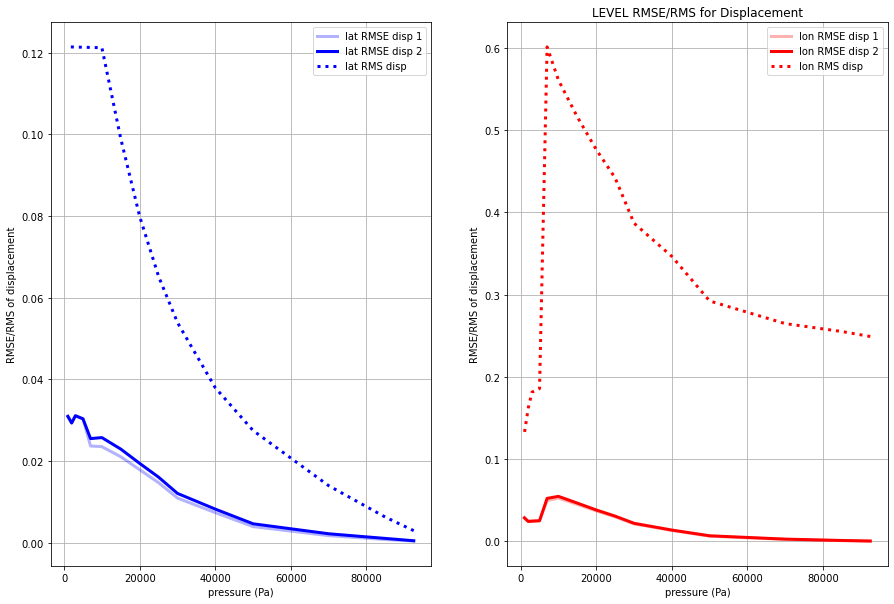

<_io.TextIOWrapper name='/users/staff/leo/ectrans/era5.bufr.202007' mode='r' encoding='UTF-8'>
pandas error
pandas error
pandas error
pandas error
pandas error
pandas error
pandas error
pandas error
pandas error
pandas error
pandas error
pandas error
pandas error
pandas error
pandas error
pandas error
pandas error
pandas error
pandas error
pandas error
pandas error
30.450000000000003 -84.30000000000001 20200630.0 230000.0
lat disp rmse:  0.00592264443562637
lon disp rmse:  0.011890316900370559
----------------
37.760000000000005 -99.97000000000001 20200630.0 230000.0
lat disp rmse:  0.02821188382534882
lon disp rmse:  0.028116471562290187
----------------
31.94 -102.19000000000001 20200630.0 230300.0
lat disp rmse:  0.002794512309187515
lon disp rmse:  0.013230072133726829
----------------
43.06 -108.48 20200630.0 230300.0
lat disp rmse:  0.002049027200912253
lon disp rmse:  0.02537885316801278
----------------
pandas error
pandas error
pandas error
pandas error
37.74 -122.220000000000

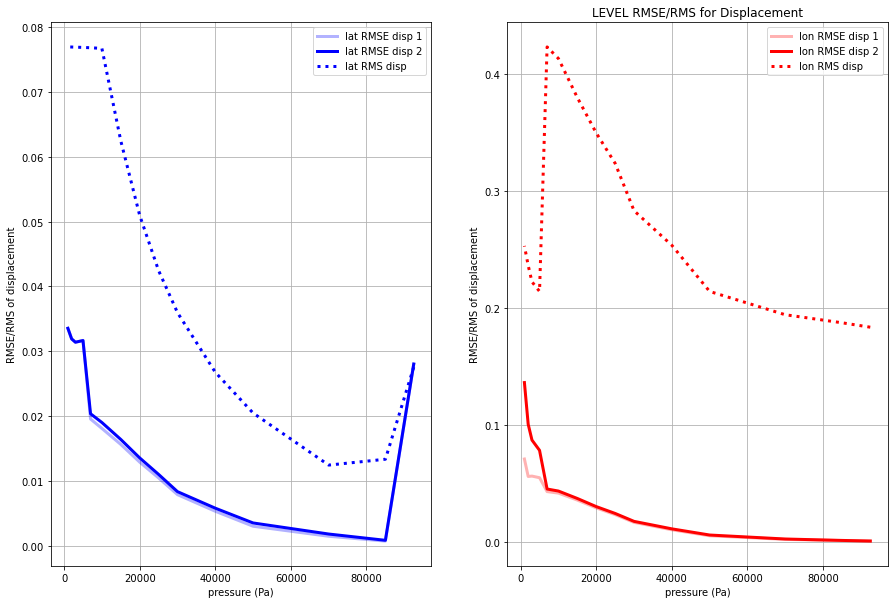

In [12]:
for i in ['05', '07']:
    ipath=os.path.expanduser('~leo/ectrans/')
    sodblist=glob.glob(ipath+'era5.bufr.2020'+i)
    sodblist.sort(key=os.path.getsize)
    out, df= par_read_bufr_stn_nofeedback(111, sodblist[0]) # './sounding109_2020'+i+'.bufr') #
    for j in df:
        try:
            df[j]=numpy.concatenate( df[j], axis=0 )
        except:
            pass
    mldf = pd.DataFrame(df)
    mldf.to_pickle('mldf_compare_full_'+i+'_statid.p')
    # func = partial(par_read_bufr_stn_nofeedback,111)
    # list(map(func,sodblist))

    # # exit()

In [16]:
df

{'temperature': [array([274.94, 275.03, 275.11, ..., 216.8 , 216.71, 216.66]),
  array([280.63, 280.5 , 280.38, ..., 208.14, 208.11, 208.09]),
  array([282.24, 282.15, 282.25, ..., 215.32, 215.31, 215.28]),
  array([284.01, 283.97, 283.93, ..., 210.31, 210.26, 210.2 ]),
  array([280.49, 280.53, 280.42, ..., 209.93, 209.94, 209.95]),
  array([272.96, 272.9 , 272.84, ..., 213.66, 213.78, 213.84]),
  array([272.4 , 272.35, 272.29, ..., 218.05, 218.02, 217.96]),
  array([302.31, 302.18, 302.04, ..., 190.04, 190.06, 190.09]),
  array([276.3 , 276.24, 276.19, ..., 212.2 , 212.16, 212.12]),
  array([291.79, 291.81, 291.81, ..., 201.85, 201.82, 201.78]),
  array([278.48, 278.75, 278.87, ..., 215.99, 215.96, 215.92]),
  array([273.86, 273.85, 273.82, ..., 214.1 , 214.11, 214.11]),
  array([282.66, 282.68, 282.73, ..., 210.66, 210.64, 210.63]),
  array([275.09, 275.12, 275.14, ..., 216.69, 216.68, 216.66]),
  array([277.01, 276.96, 276.9 , ..., 213.06, 213.02, 212.97]),
  array([286.13, 286.19, 

---
# ML
---

In [13]:
# try:
#     with open("mldf_1000.p", "rb") as input_file:
#         mldf = pickle.load(input_file)
# except:
for i in df:
    try:
        df[i]=numpy.concatenate( df[i], axis=0 )
    except:
        pass
mldf = pd.DataFrame(df)
mldf.to_pickle('mldf_compare_full_dec_statid.p')


cut = int(len(mldf)*0.80)
train = mldf[:cut]
test = mldf[cut:]

In [18]:
ipath=os.path.expanduser('~leo/ectrans/')
sodblist=glob.glob(ipath+'era5.bufr.202001')
sodblist.sort(key=os.path.getsize)
out, df= par_read_bufr_stn_nofeedback(111, './sounding109_202001.bufr') # sodblist[0])
# func = partial(par_read_bufr_stn_nofeedback,111)
# list(map(func,sodblist))

# # exit()

FileNotFoundError: [Errno 2] No such file or directory: './sounding109_202001.bufr'

In [ ]:
# try:
#     with open("mldf_1000.p", "rb") as input_file:
#         mldf = pickle.load(input_file)
# except:
for i in df:
    try:
        df[i]=numpy.concatenate( df[i], axis=0 )
    except:
        pass
mldf = pd.DataFrame(df)
mldf.to_pickle('mldf_compare_full_jan.p')


cut = int(len(mldf)*0.80)
train = mldf[:cut]
test = mldf[cut:]

In [14]:
new = test.reset_index()
testidx = []
for i in range(len(new)):
    if i != 0:
        if new.z[i] < new.z[i-1]:
            print('z[',i-1,']: ', new.z[i-1], 'z[',i,']: ',new.z[i], '')
            testidx.append(i)

z[ 1867 ]:  16757.548532230314 z[ 1868 ]:  59.13077487559159 
z[ 5487 ]:  16687.644665457523 z[ 5488 ]:  685.3602358933512 
z[ 8590 ]:  16479.010473840975 z[ 8591 ]:  330.12624540545335 
z[ 12908 ]:  16694.750262847934 z[ 12909 ]:  96.91477598998492 
z[ 16318 ]:  16506.870626266274 z[ 16319 ]:  929.142371383185 
z[ 19131 ]:  16746.036426925093 z[ 19132 ]:  724.10632770673 
z[ 21954 ]:  16521.230703681278 z[ 21955 ]:  223.66730605179666 
z[ 24956 ]:  16716.458214935064 z[ 24957 ]:  939.3684380317492 
z[ 27939 ]:  16590.85252204673 z[ 27940 ]:  2010.2852812765507 
z[ 30595 ]:  16319.738276379927 z[ 30596 ]:  1007.4157209435455 
z[ 33396 ]:  16457.868892610644 z[ 33397 ]:  1525.0421752747022 
z[ 36227 ]:  16425.30641628103 z[ 36228 ]:  463.94136408906127 
z[ 39321 ]:  16707.464085172294 z[ 39322 ]:  36.83157697393047 
z[ 42586 ]:  16692.475400155567 z[ 42587 ]:  1148.395082364501 
z[ 45506 ]:  16660.10655597952 z[ 45507 ]:  634.7721509123329 
z[ 48653 ]:  16436.374684887658 z[ 48654 ]:  1

---
---

In [26]:
train = train.dropna()

In [27]:
try:
    with open('model_dt_1000_summer.p', "rb") as input_file:
        model_dt = pickle.load(input_file)
#     with open('model_dt_wo_coords_1000.p', "rb") as input_file:
#         model_dt_wo_coords = pickle.load(input_file)
    print('loading successful')
    
except:
    model_dt = DecisionTreeRegressor()
    model_dt.fit(train[['temperature', 'pressure', 'u', 'v', 'z','lat', 'lon' , 'calc_latd', 'calc_lond']], train[['latd', 'lond']])

    #     model_dt_wo_coords = DecisionTreeRegressor()
    #     model_dt_wo_coords.fit(train[['temperature', 'pressure', 'u', 'v', 'z','calc_latd', 'calc_lond']], train[['latd', 'lond']])


    with open("model_dt_1000_summer.p", "wb") as output_file:
        pickle.dump(model_dt, output_file)
    #     with open("model_dt_wo_coords_1000.p", "wb") as output_file:
    #         pickle.dump(model_dt_wo_coords, output_file)

In [30]:

with open('model_dt_1000.p', "rb") as input_file:
    model_dt_winter = pickle.load(input_file)
#     with open('model_dt_wo_coords_1000.p', "rb") as input_file:
#         model_dt_wo_coords = pickle.load(input_file)
print('loading successful')

loading successful


In [28]:
def find_nearest(array, value):
    array = np.asarray(array)
    idx = (np.abs(array - value)).argmin()
    return array[idx]

[100030.0, 92480.0, 85010.0, 70020.0, 50000.0, 40000.0, 30000.0, 25000.0, 20000.0, 15000.0, 10000.0]


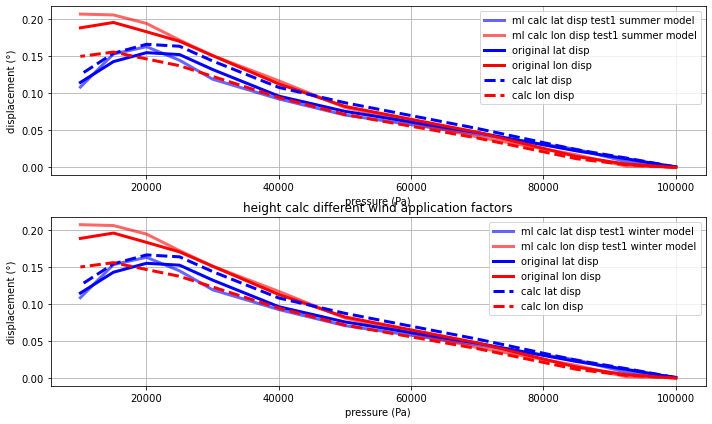

lat disp rmse:  0.006767337109719479
lon disp rmse:  0.007676651336857722
[92500.0, 85000.0, 69990.0, 49990.0, 40000.0, 30000.0, 25000.0, 20000.0, 15000.0, 10000.0]


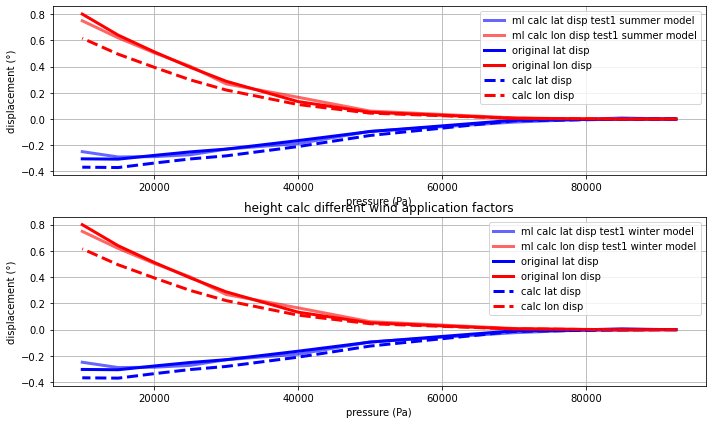

lat disp rmse:  0.021561117461717207
lon disp rmse:  0.021696530223536285
[92490.0, 85000.0, 70000.0, 50000.0, 40010.0, 30010.0, 25000.0, 20000.0, 15000.0, 10000.0]


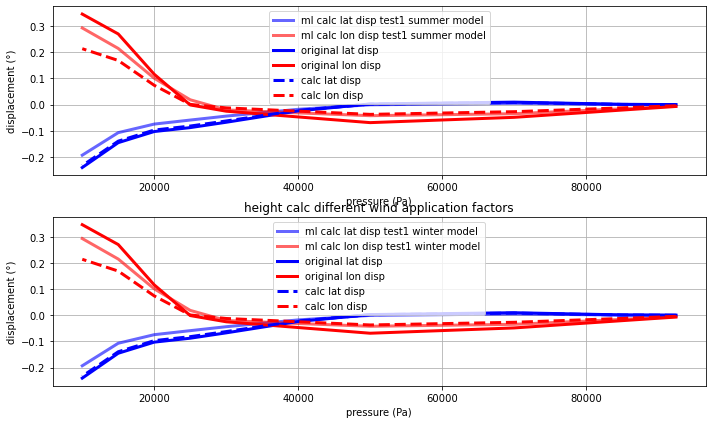

lat disp rmse:  0.024434343813992763
lon disp rmse:  0.027742925253006208
[99990.0, 92480.0, 84990.0, 70010.0, 50000.0, 39990.0, 30010.0, 25000.0, 20000.0, 15000.0, 10000.0]


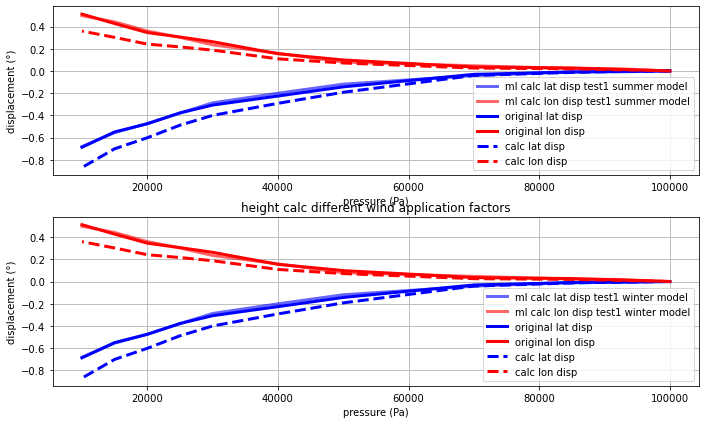

lat disp rmse:  0.01297759512105998
lon disp rmse:  0.013498440968248347
[85020.0, 70020.0, 50000.0, 40000.0, 30000.0, 25000.0, 20000.0, 15000.0, 10000.0]


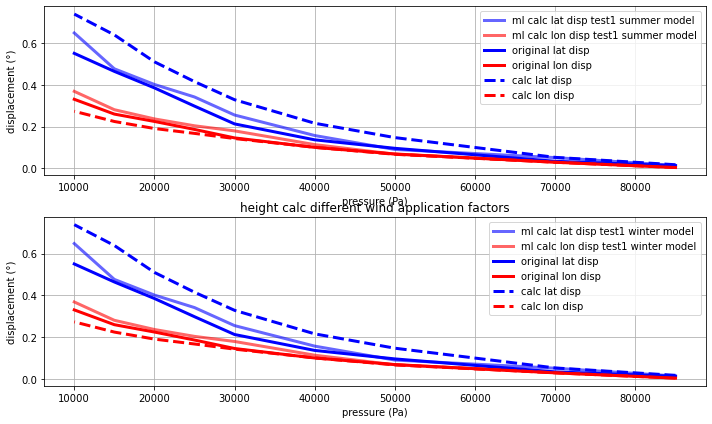

lat disp rmse:  0.04005951195462933
lon disp rmse:  0.020173856294618476
[92530.0, 85010.0, 69980.0, 49990.0, 40010.0, 30010.0, 25010.0, 20010.0, 15010.0, 10000.0]


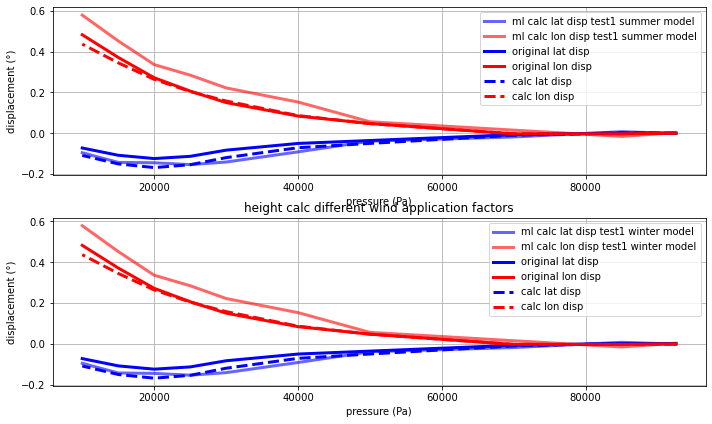

lat disp rmse:  0.030141004412695297
lon disp rmse:  0.06041368971381151
[92530.0, 85000.0, 70020.0, 49990.0, 39990.0, 29990.0, 25000.0, 20000.0, 15000.0, 10000.0]


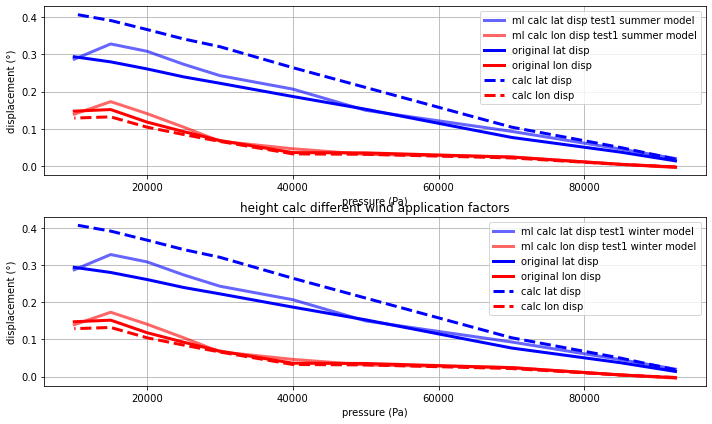

lat disp rmse:  0.026352093265613427
lon disp rmse:  0.011414904182869053
[84980.0, 69980.0, 50000.0, 40000.0, 30010.0, 25000.0, 20000.0, 15010.0, 10000.0]


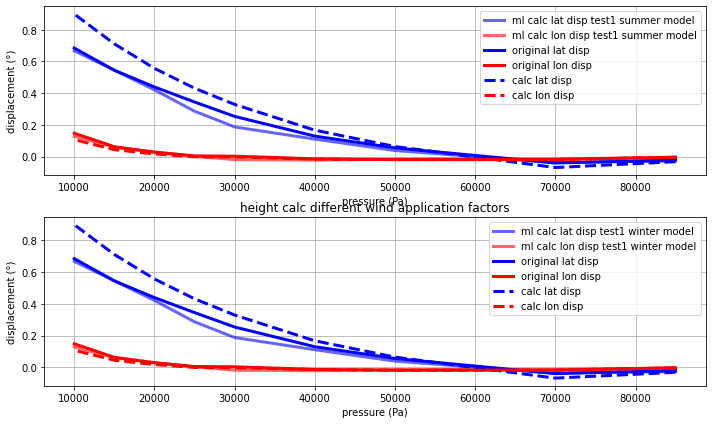

lat disp rmse:  0.03176533729949313
lon disp rmse:  0.010316960038139632
[69990.0, 50020.0, 39990.0, 30010.0, 25000.0, 20000.0, 15000.0, 10000.0]


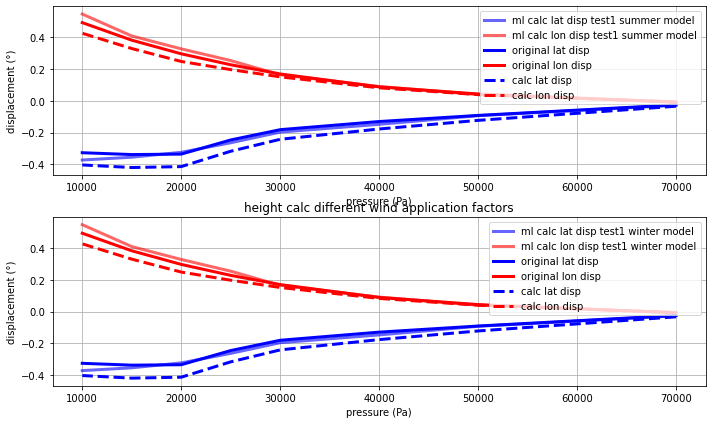

lat disp rmse:  0.020621786537048364
lon disp rmse:  0.02582641648445587
[85000.0, 70000.0, 49990.0, 39990.0, 29990.0, 25000.0, 20000.0, 15000.0, 10000.0]


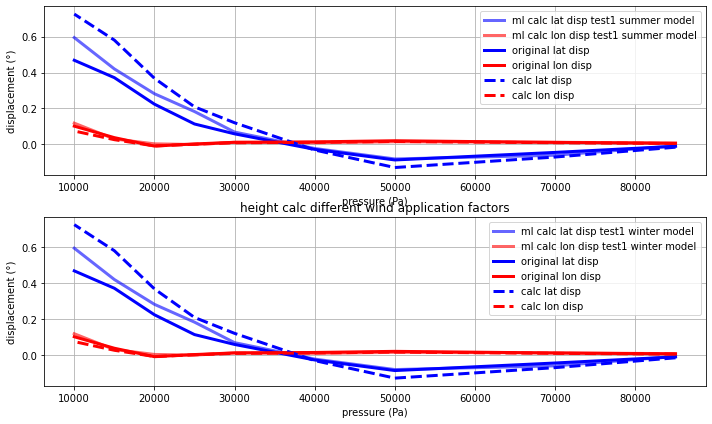

lat disp rmse:  0.05463273711164978
lon disp rmse:  0.007953801093041345
[70020.0, 50020.0, 39990.0, 29990.0, 25000.0, 20000.0, 15000.0, 10000.0]


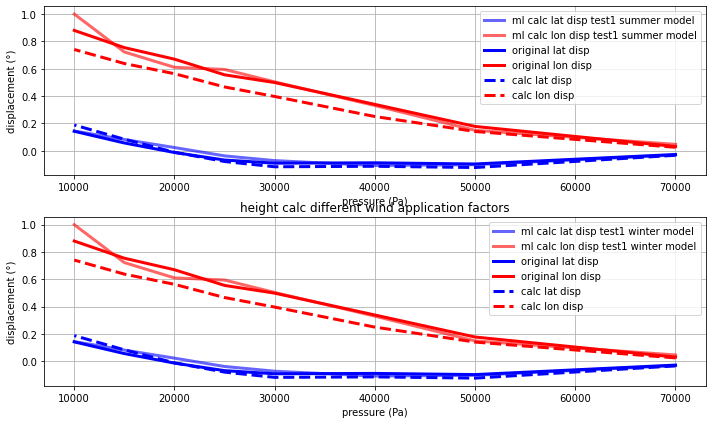

lat disp rmse:  0.021400584667115696
lon disp rmse:  0.051887489585493336
[92500.0, 85020.0, 70000.0, 50000.0, 40010.0, 30000.0, 25010.0, 20000.0, 15000.0, 10000.0]


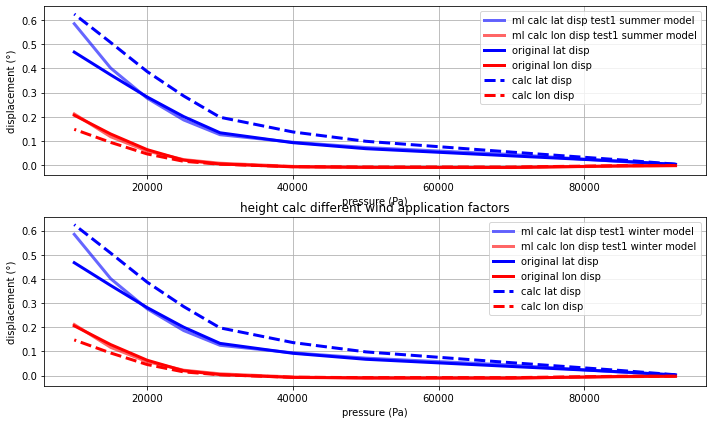

lat disp rmse:  0.038602472234459735
lon disp rmse:  0.004632744541603313
[100020.0, 92490.0, 84980.0, 70000.0, 49990.0, 40000.0, 30000.0, 25000.0, 20010.0, 15000.0, 10000.0]


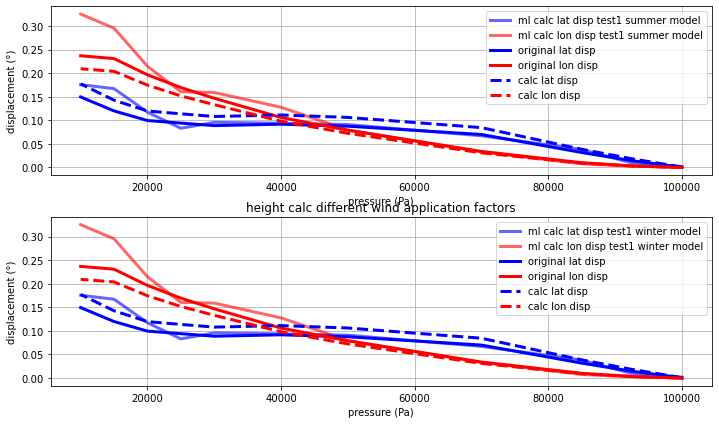

lat disp rmse:  0.017830543519488137
lon disp rmse:  0.0344375896920194
[85010.0, 70010.0, 49990.0, 39990.0, 30010.0, 25010.0, 20000.0, 15000.0, 10000.0]


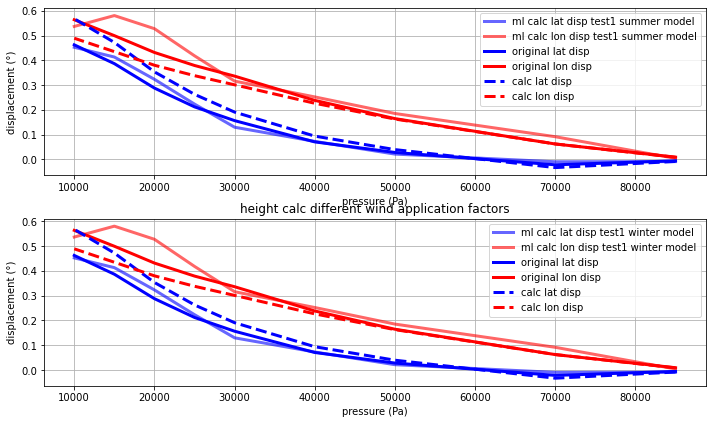

lat disp rmse:  0.018544883759736272
lon disp rmse:  0.04703796075022469
[92520.0, 84990.0, 70020.0, 50020.0, 39990.0, 30000.0, 25000.0, 20010.0, 15000.0, 10000.0]


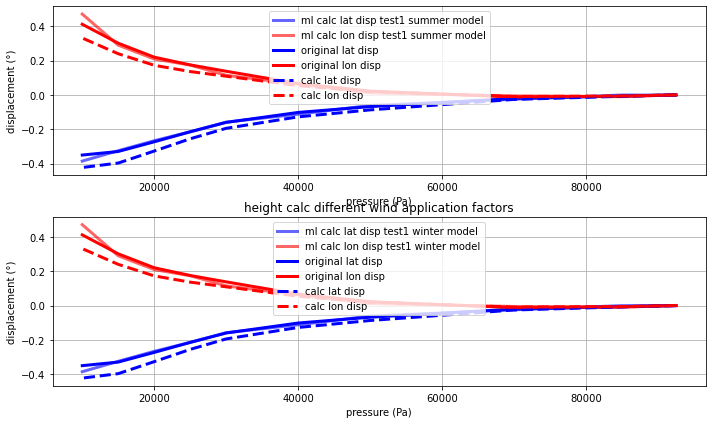

lat disp rmse:  0.012283568882196703
lon disp rmse:  0.021241738914654997
[69990.0, 50010.0, 39990.0, 29990.0, 25010.0, 20000.0, 15000.0, 10000.0]


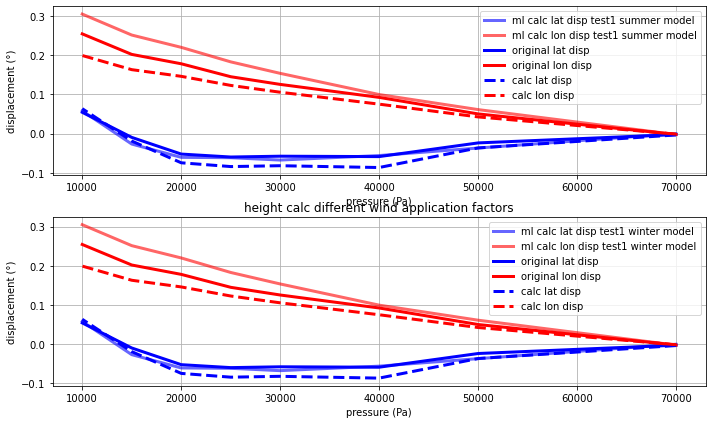

lat disp rmse:  0.00907060794558725
lon disp rmse:  0.033803844931691016
[92490.0, 85030.0, 70020.0, 50000.0, 40010.0, 30000.0, 25010.0, 20010.0, 15000.0, 10000.0]


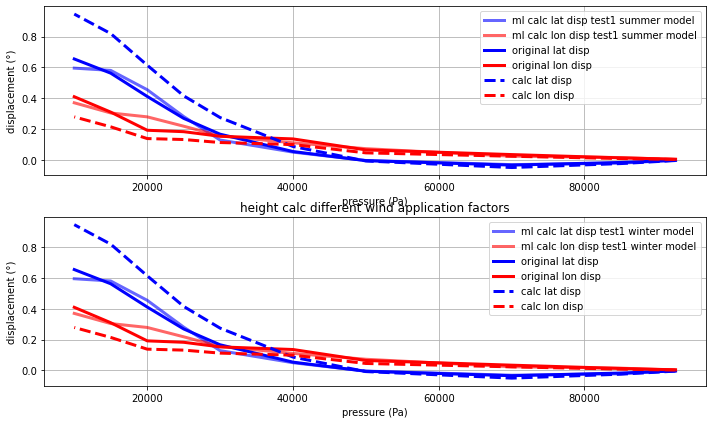

lat disp rmse:  0.02721528170910852
lon disp rmse:  0.03354149028250574
[85030.0, 70010.0, 49990.0, 40010.0, 30010.0, 25000.0, 20010.0, 15000.0, 10000.0]


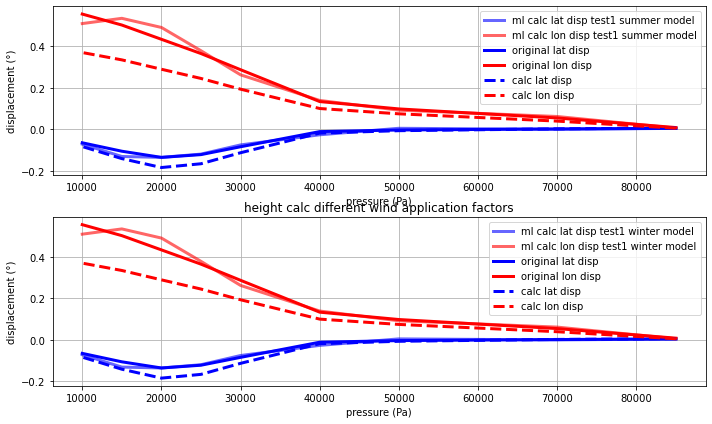

lat disp rmse:  0.010957325814680756
lon disp rmse:  0.028516959723562496
[100030.0, 92490.0, 84990.0, 70010.0, 50000.0, 39990.0, 30010.0, 25010.0, 20010.0, 15000.0, 10000.0]


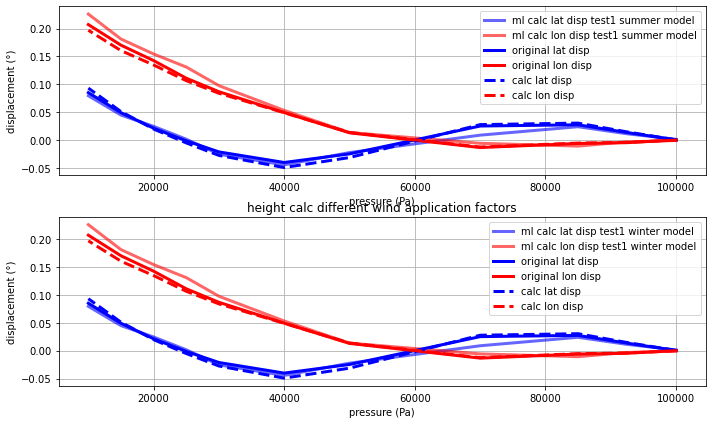

lat disp rmse:  0.006006581020717314
lon disp rmse:  0.01058737660642651
[100000.0, 92490.0, 85020.0, 69980.0, 49990.0, 40000.0, 30000.0, 25010.0, 20010.0, 15000.0, 10000.0]


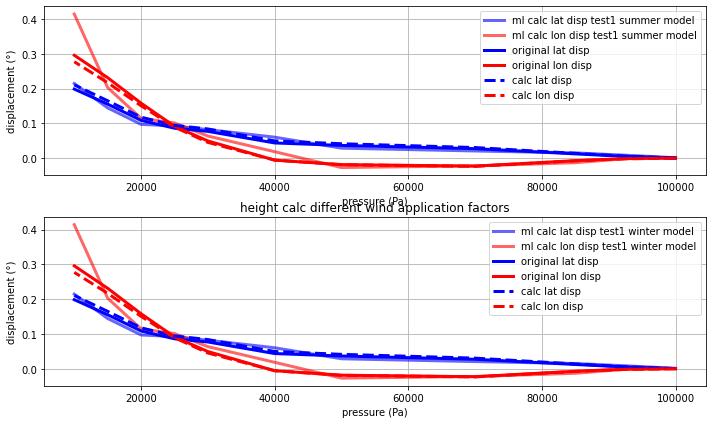

lat disp rmse:  0.009416892933025124
lon disp rmse:  0.040088136063601204
[85010.0, 70020.0, 49990.0, 40000.0, 30000.0, 25000.0, 20010.0, 15000.0, 10000.0]


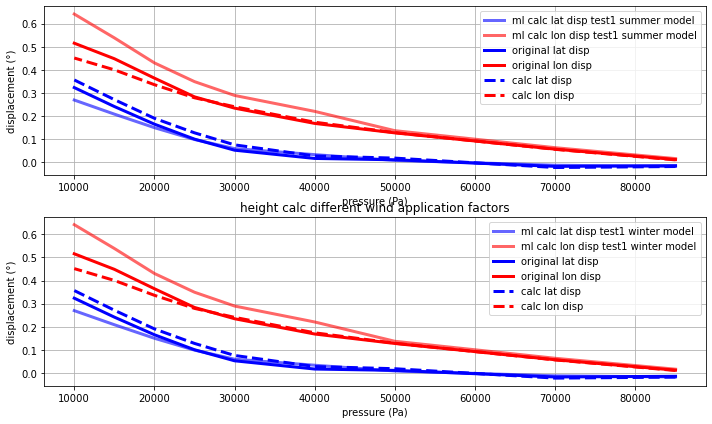

lat disp rmse:  0.022544075431300378
lon disp rmse:  0.06544179806353935
[92470.0, 84980.0, 69980.0, 50010.0, 39990.0, 30010.0, 25010.0, 20000.0, 15010.0, 10000.0]


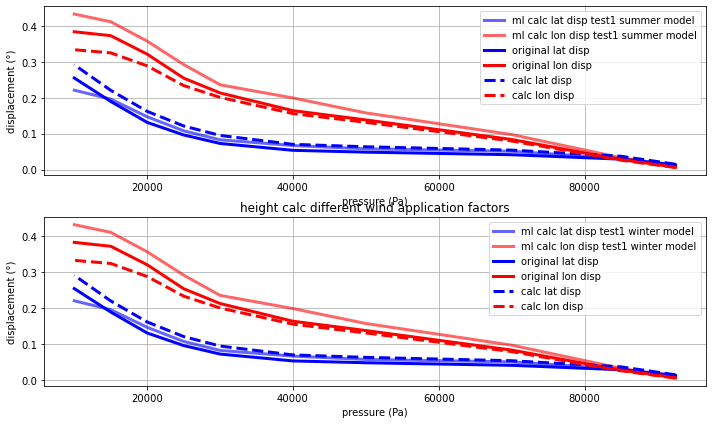

lat disp rmse:  0.014280083399759436
lon disp rmse:  0.030035130195033972
[92520.0, 85000.0, 70020.0, 49990.0, 40010.0, 30010.0, 25010.0, 20000.0, 15000.0, 10000.0]


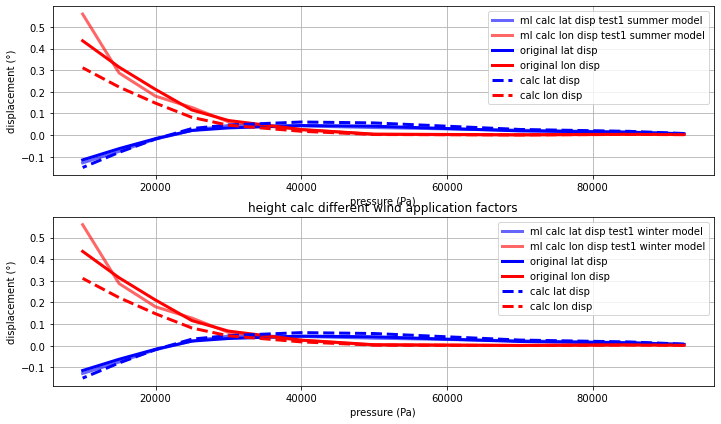

lat disp rmse:  0.007330247013684492
lon disp rmse:  0.04137433416824161
[84670.0, 70000.0, 49990.0, 40000.0, 30000.0, 25000.0, 20000.0, 15000.0, 10000.0]


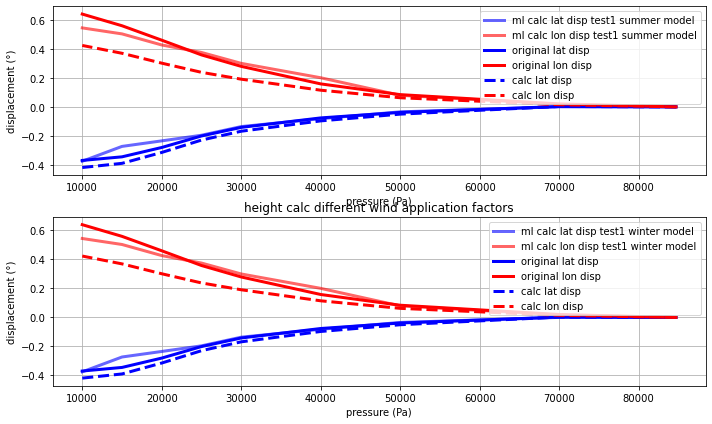

lat disp rmse:  0.028660866982929058
lon disp rmse:  0.04199512761971266
[100010.0, 92490.0, 85010.0, 70020.0, 50000.0, 39990.0, 30000.0, 25010.0, 20000.0, 15000.0, 10000.0]


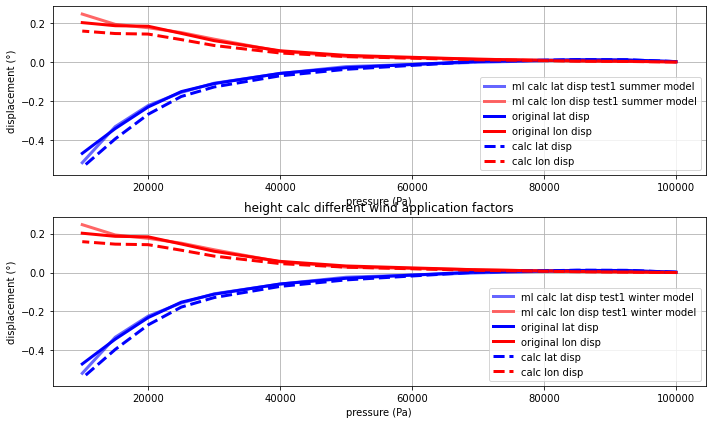

lat disp rmse:  0.015228098929708408
lon disp rmse:  0.013999635320522019
[100010.0, 92510.0, 84980.0, 70000.0, 49990.0, 40010.0, 30010.0, 25000.0, 20000.0, 15000.0, 10000.0]


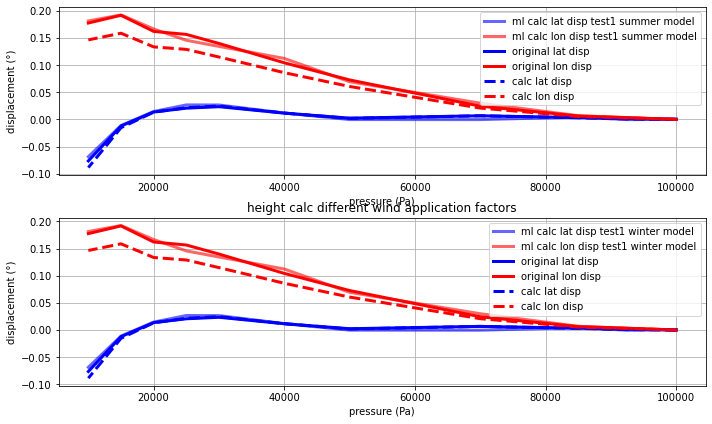

lat disp rmse:  0.003918232867657901
lon disp rmse:  0.005138772322398274
[92530.0, 85000.0, 70020.0, 50000.0, 40010.0, 30000.0, 25000.0, 20010.0, 15000.0, 10000.0]


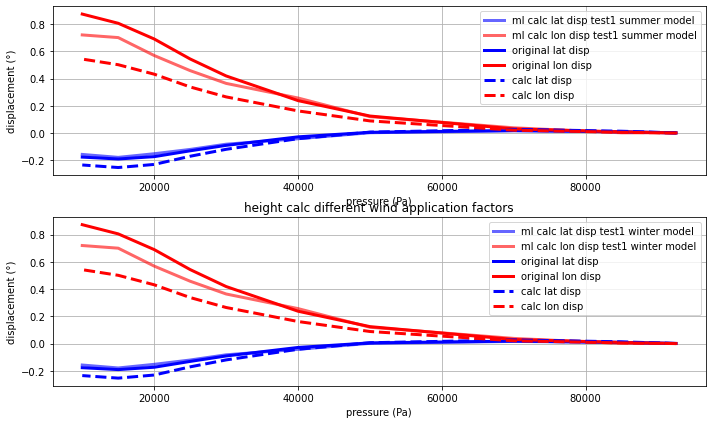

lat disp rmse:  0.011731154346353223
lon disp rmse:  0.0774453892514873
[99980.0, 92500.0, 85000.0, 70000.0, 50010.0, 40010.0, 30010.0, 25010.0, 20000.0, 15000.0, 10000.0]


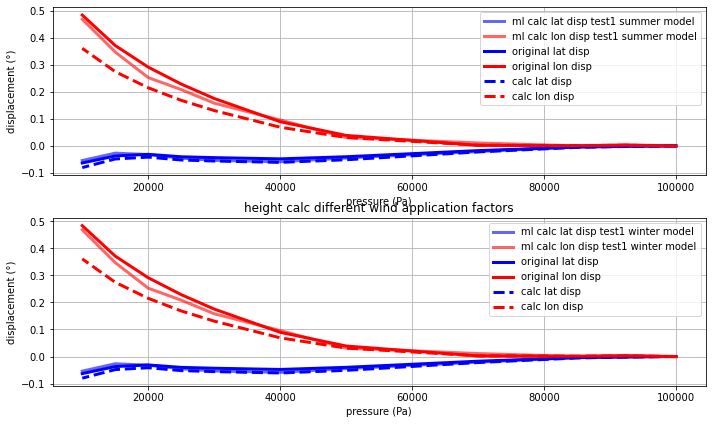

lat disp rmse:  0.006521292220449045
lon disp rmse:  0.017098880166709077
[99990.0, 92520.0, 85020.0, 70010.0, 49990.0, 39990.0, 30010.0, 25010.0, 20000.0, 15010.0, 10000.0]


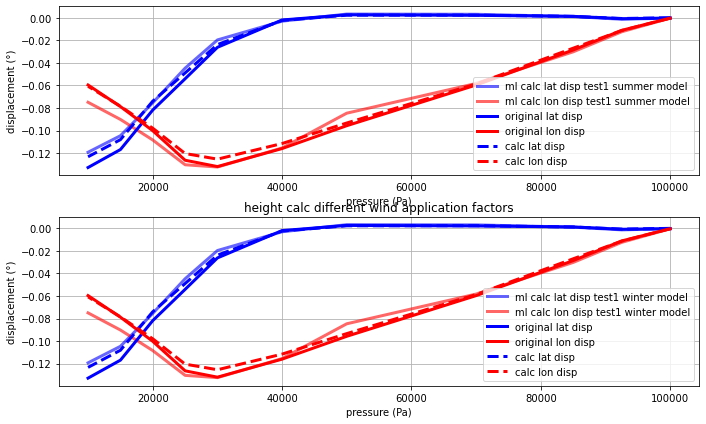

lat disp rmse:  0.006801410343349998
lon disp rmse:  0.007246505512383299
[92490.0, 85030.0, 70000.0, 50010.0, 39990.0, 30010.0, 25000.0, 20010.0, 15000.0, 10000.0]


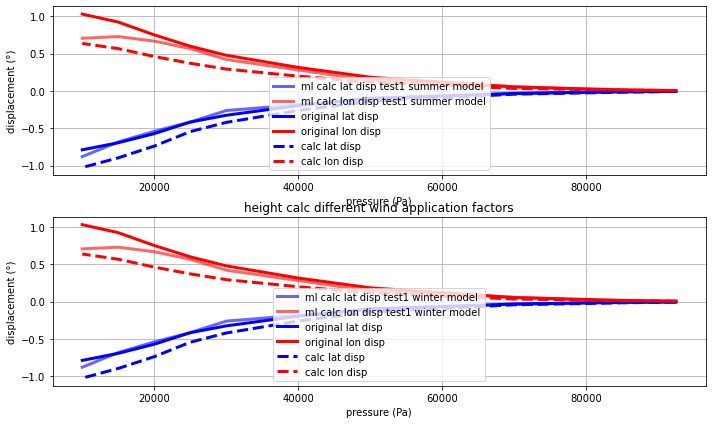

lat disp rmse:  0.03701546129712241
lon disp rmse:  0.12533508151639977
[92490.0, 84980.0, 69990.0, 50000.0, 39990.0, 30010.0, 25000.0, 20000.0, 15010.0, 10000.0]


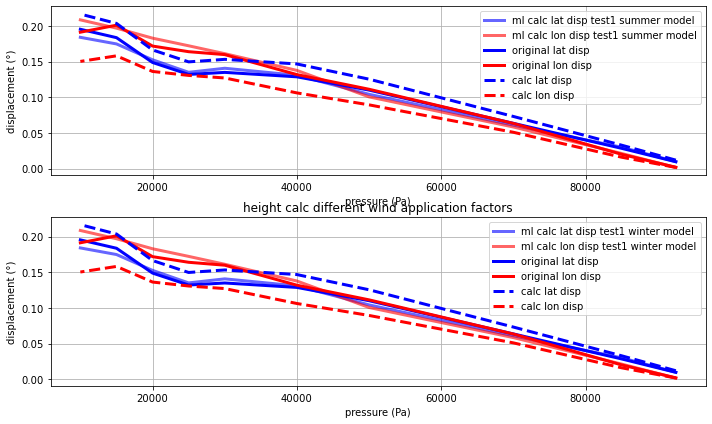

lat disp rmse:  0.00556509685431984
lon disp rmse:  0.008272899968313003
[99570.0, 92480.0, 85020.0, 70010.0, 50010.0, 40000.0, 30010.0, 25000.0, 20000.0, 15000.0, 10000.0]


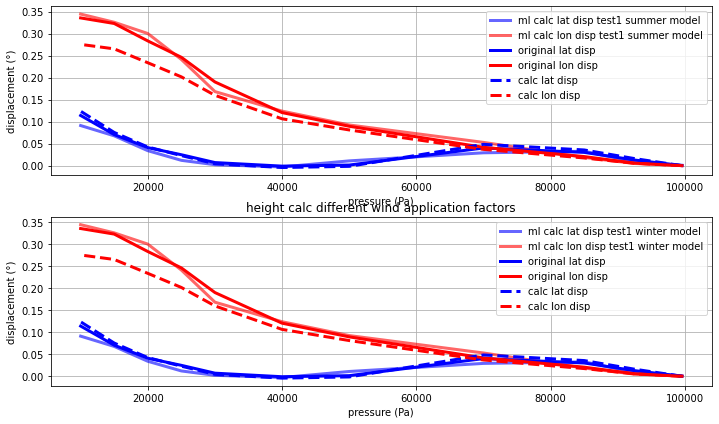

lat disp rmse:  0.009538591008656798
lon disp rmse:  0.009641289402331872
[92480.0, 85030.0, 69990.0, 49990.0, 40000.0, 29990.0, 25010.0, 20000.0, 15010.0, 10000.0]


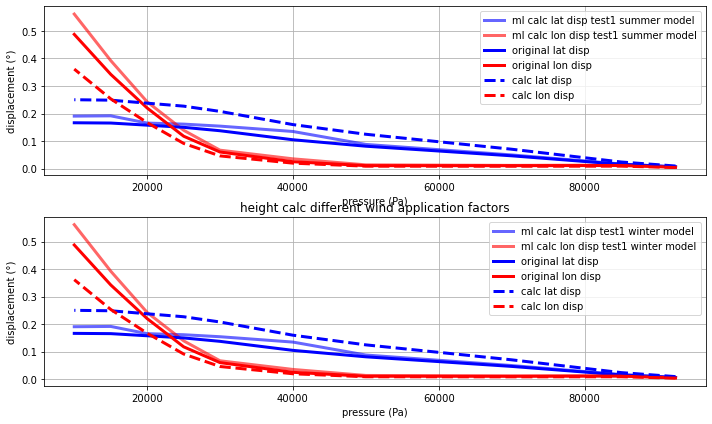

lat disp rmse:  0.016423025078796165
lon disp rmse:  0.030094358873790212
[85030.0, 69990.0, 50010.0, 39990.0, 30010.0, 25010.0, 20000.0, 15000.0, 10000.0]


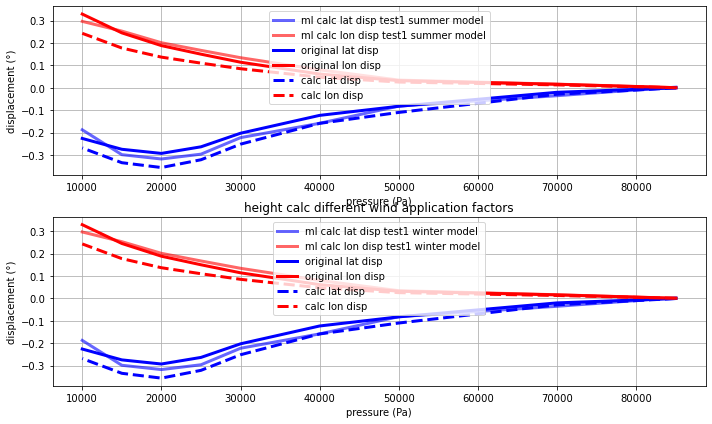

lat disp rmse:  0.025031805707576578
lon disp rmse:  0.016145215524875293
[92500.0, 84980.0, 70010.0, 50000.0, 40000.0, 30000.0, 25000.0, 20010.0, 15000.0, 10000.0]


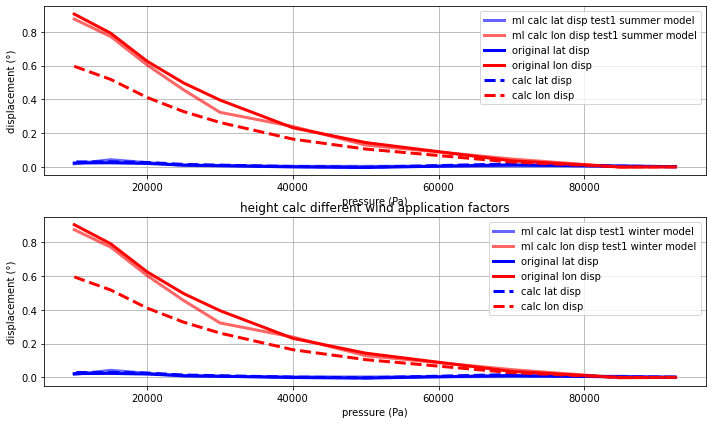

lat disp rmse:  0.007183672071625544
lon disp rmse:  0.03020389093075858
[100030.0, 92520.0, 85020.0, 70010.0, 50020.0, 39990.0, 29990.0, 25010.0, 20000.0, 15000.0, 10000.0]


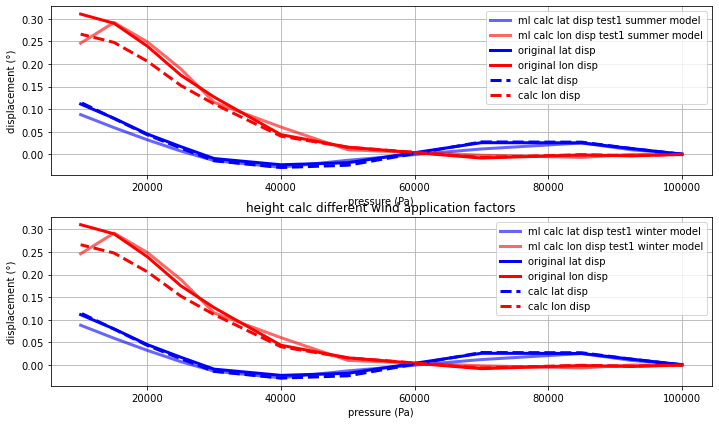

lat disp rmse:  0.011755094937467287
lon disp rmse:  0.02124087307780968
[92520.0, 84980.0, 69980.0, 50010.0, 40000.0, 30010.0, 25000.0, 20000.0, 15010.0, 10000.0]


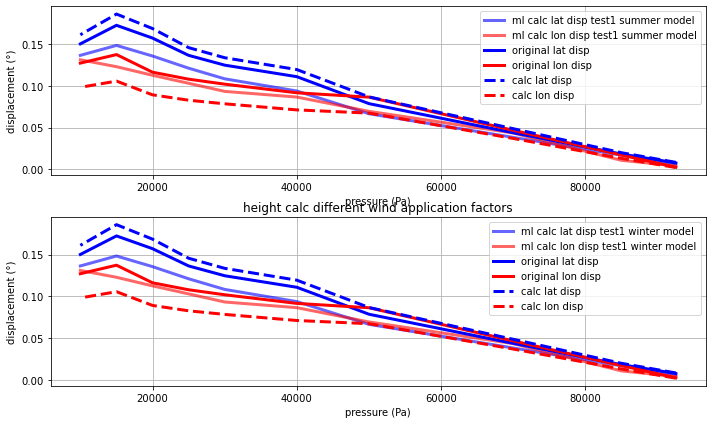

lat disp rmse:  0.014825599819369316
lon disp rmse:  0.0083952234402811
[92490.0, 84990.0, 70020.0, 50000.0, 40010.0, 30000.0, 25000.0, 20000.0, 15000.0, 10000.0]


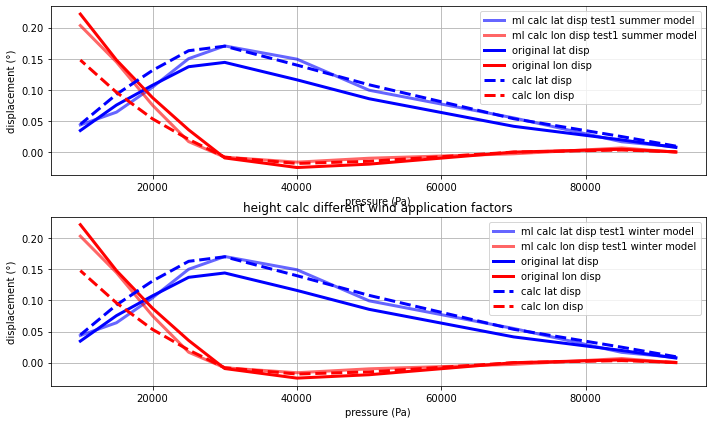

lat disp rmse:  0.016035817234667963
lon disp rmse:  0.010177470813276943
[85000.0, 69990.0, 50000.0, 40010.0, 30010.0, 25000.0, 20010.0, 15000.0, 10000.0]


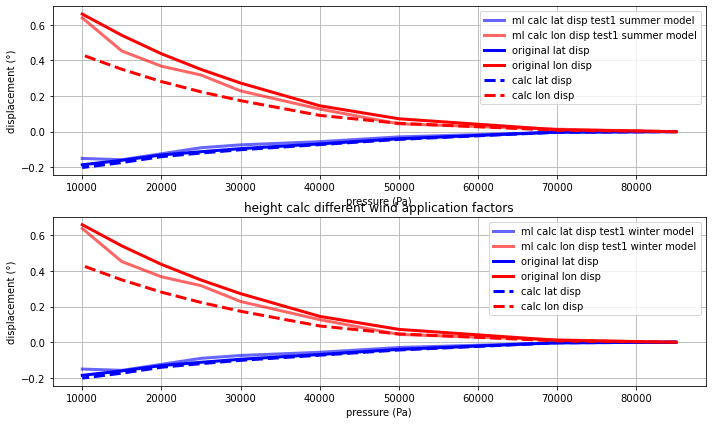

lat disp rmse:  0.016703092682049357
lon disp rmse:  0.04364423420657608
[92510.0, 85010.0, 70000.0, 49990.0, 39990.0, 30000.0, 25000.0, 20000.0, 15000.0, 10000.0]


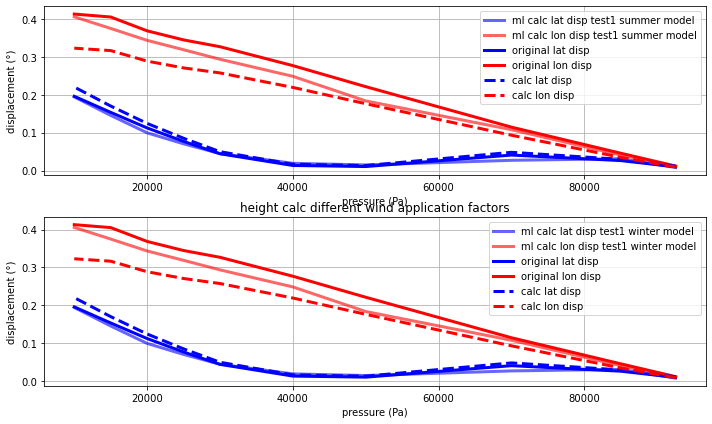

lat disp rmse:  0.007385305895589491
lon disp rmse:  0.02377873086883856
[92490.0, 84980.0, 69990.0, 50000.0, 40000.0, 30010.0, 25010.0, 20000.0, 15000.0, 10000.0]


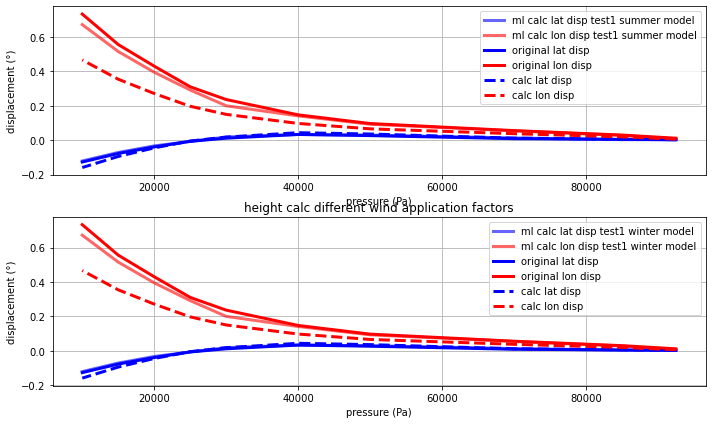

lat disp rmse:  0.004318037444658105
lon disp rmse:  0.02888087407480085
[92530.0, 84990.0, 70010.0, 50020.0, 39990.0, 29990.0, 25000.0, 20010.0, 15010.0, 10000.0]


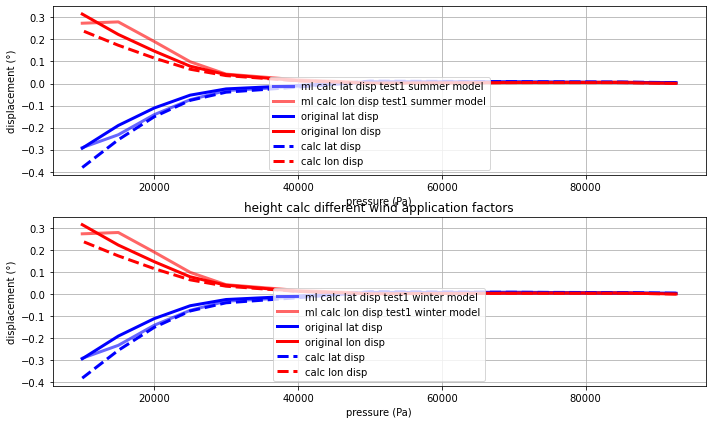

lat disp rmse:  0.017947555445616194
lon disp rmse:  0.027005916753593914
[100000.0, 92500.0, 85020.0, 70010.0, 50020.0, 40000.0, 30000.0, 25000.0, 20000.0, 15000.0, 10000.0]


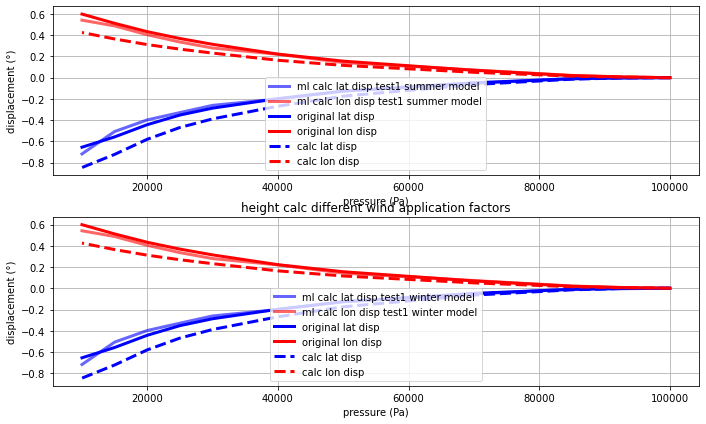

lat disp rmse:  0.030037252541211035
lon disp rmse:  0.02563435371420738
[84980.0, 70000.0, 50000.0, 40010.0, 29990.0, 25010.0, 20000.0, 15000.0, 10000.0]


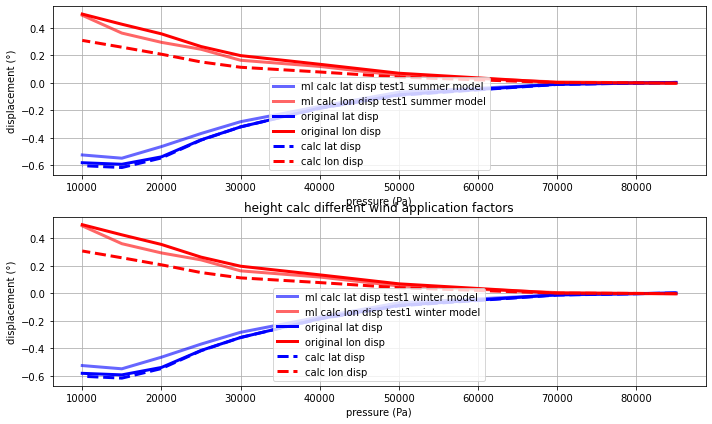

lat disp rmse:  0.04062136118429407
lon disp rmse:  0.033545255197667545
[99790.0, 92490.0, 85000.0, 69980.0, 50000.0, 40010.0, 30010.0, 25000.0, 20000.0, 15000.0, 10000.0]


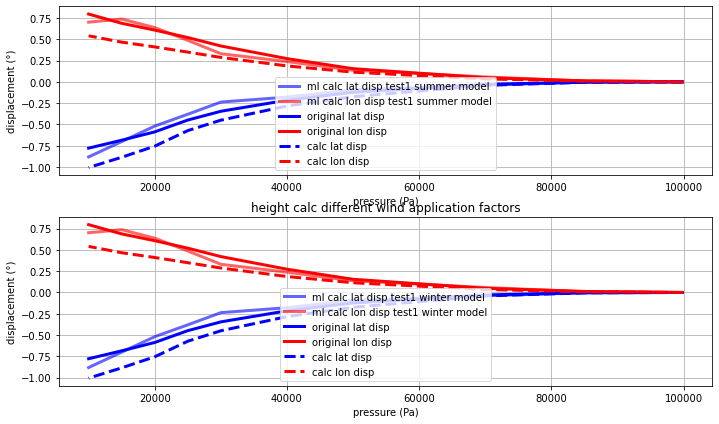

lat disp rmse:  0.055765371758299494
lon disp rmse:  0.046044813047113387
[92500.0, 84990.0, 69980.0, 50000.0, 40000.0, 30010.0, 25000.0, 20010.0, 15000.0, 10000.0]


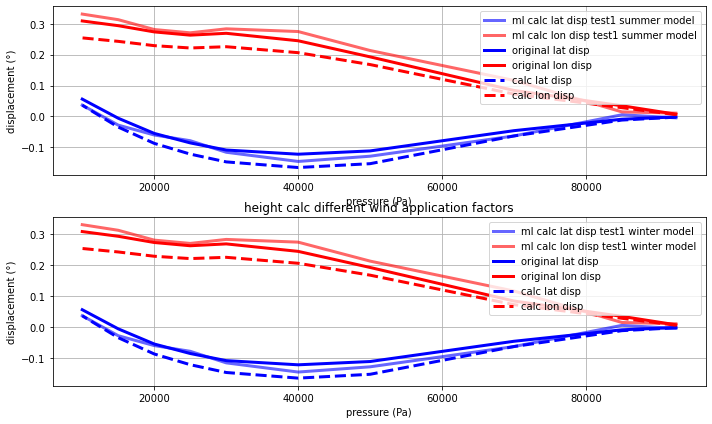

lat disp rmse:  0.015364977478881253
lon disp rmse:  0.01993027209399839
[92490.0, 85010.0, 70010.0, 50000.0, 40010.0, 30010.0, 25000.0, 20000.0, 15000.0, 10000.0]


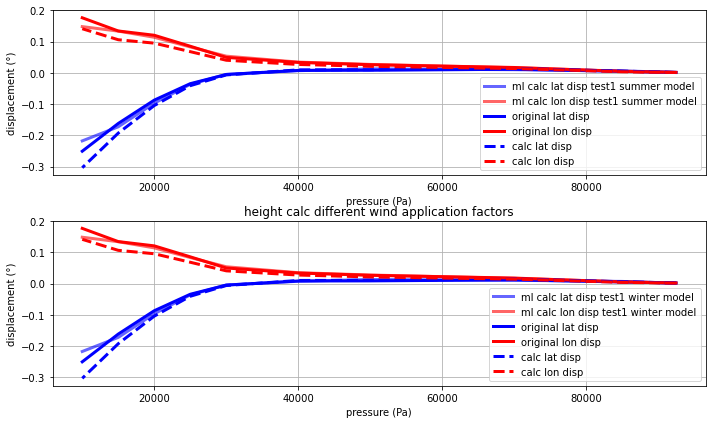

lat disp rmse:  0.011537356625239742
lon disp rmse:  0.009304424891701104
[100000.0, 92500.0, 84980.0, 70000.0, 49990.0, 40010.0, 30000.0, 25000.0, 20000.0, 15010.0, 10000.0]


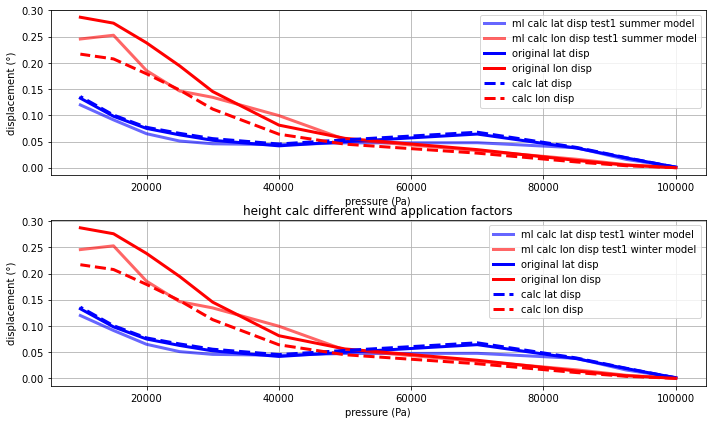

lat disp rmse:  0.008468864010097355
lon disp rmse:  0.026684918506308483
[99990.0, 92520.0, 85010.0, 70010.0, 49990.0, 40010.0, 30010.0, 25010.0, 20000.0, 15000.0, 10000.0]


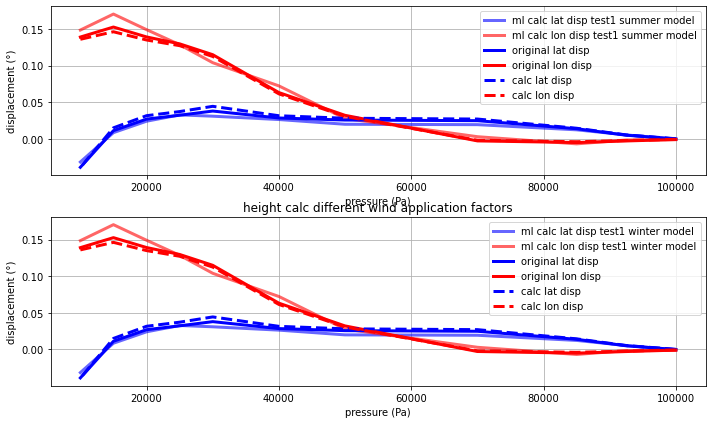

lat disp rmse:  0.004123603490149145
lon disp rmse:  0.008325320487905755
[99980.0, 92520.0, 85010.0, 70020.0, 49990.0, 40010.0, 30010.0, 25000.0, 20010.0, 15000.0, 10000.0]


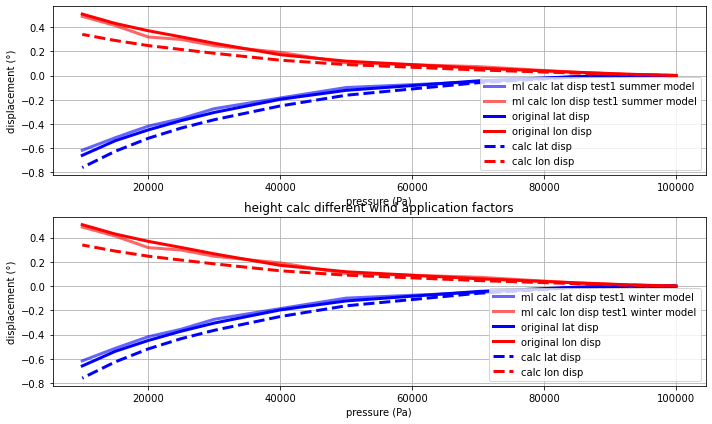

lat disp rmse:  0.02198178451820584
lon disp rmse:  0.02114448453512252
[100000.0, 92480.0, 85000.0, 70010.0, 49990.0, 39990.0, 30000.0, 25010.0, 20000.0, 15000.0, 10000.0]


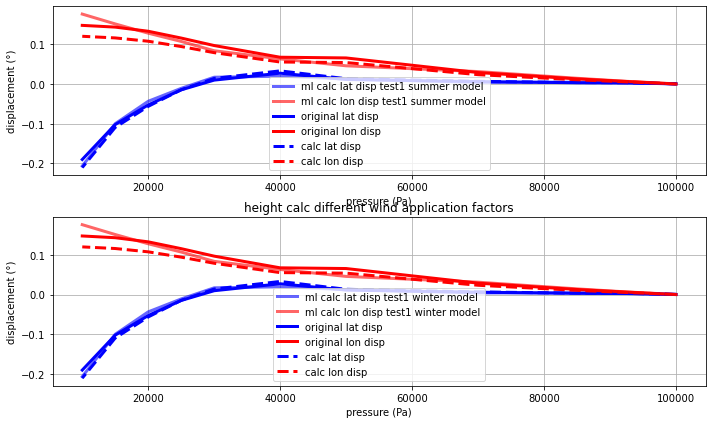

lat disp rmse:  0.006718890140619
lon disp rmse:  0.011895777443728602
[92510.0, 85010.0, 70020.0, 50010.0, 40000.0, 30000.0, 25000.0, 20000.0, 15000.0, 10000.0]


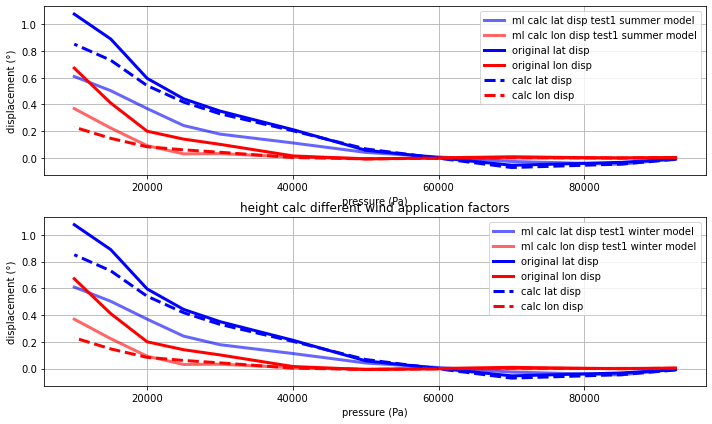

lat disp rmse:  0.2236682950940926
lon disp rmse:  0.12474247618573682
[99970.0, 92520.0, 85010.0, 70020.0, 49990.0, 40000.0, 30000.0, 25000.0, 20000.0, 15000.0, 10000.0]


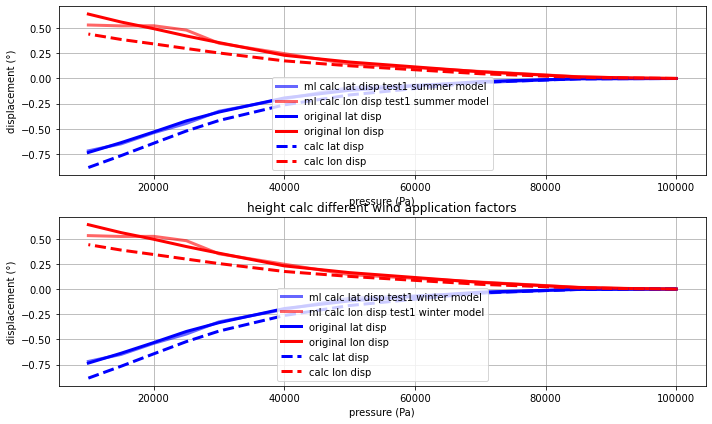

lat disp rmse:  0.013806839240015458
lon disp rmse:  0.040696775451437336
[100000.0, 92530.0, 85000.0, 70010.0, 50010.0, 39990.0, 30000.0, 25000.0, 20000.0, 15000.0, 10000.0]


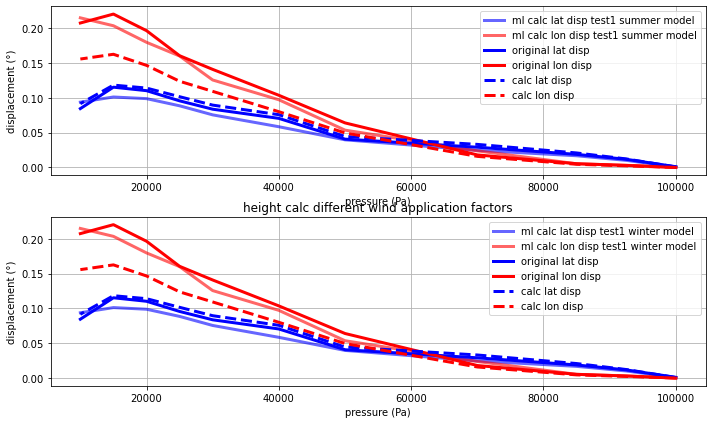

lat disp rmse:  0.008001673057661555
lon disp rmse:  0.009684376672472154
[85010.0, 69990.0, 50020.0, 39990.0, 30010.0, 25000.0, 20000.0, 15000.0, 10000.0]


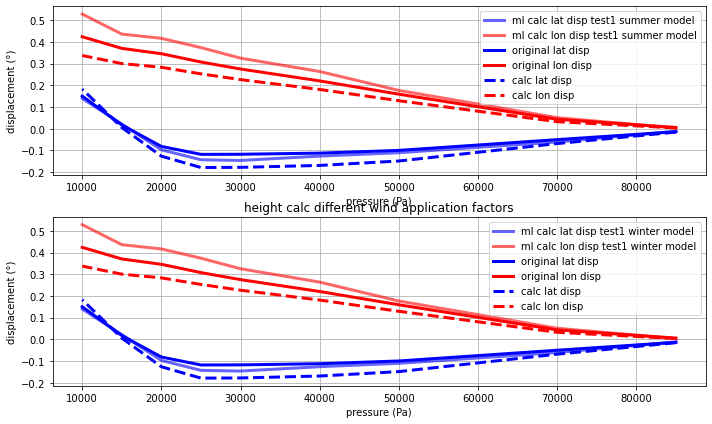

lat disp rmse:  0.015736581962258425
lon disp rmse:  0.057197301691525565
[92500.0, 84990.0, 70010.0, 50010.0, 40000.0, 30010.0, 25000.0, 20000.0, 15010.0, 10000.0]


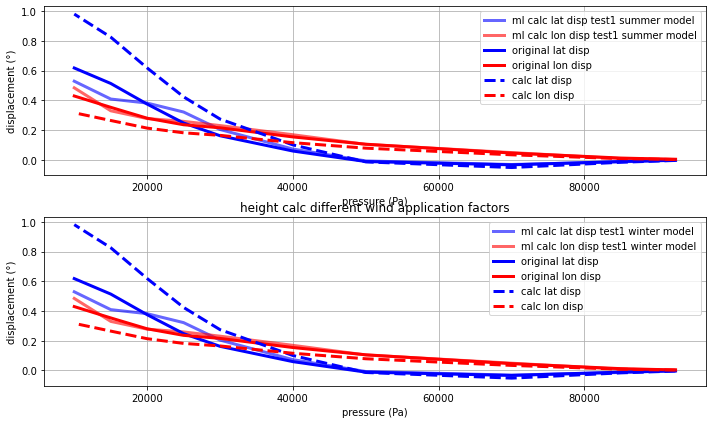

lat disp rmse:  0.051326045674885176
lon disp rmse:  0.021320031827904425
[69980.0, 49980.0, 39990.0, 30010.0, 25010.0, 20000.0, 15000.0, 10000.0]


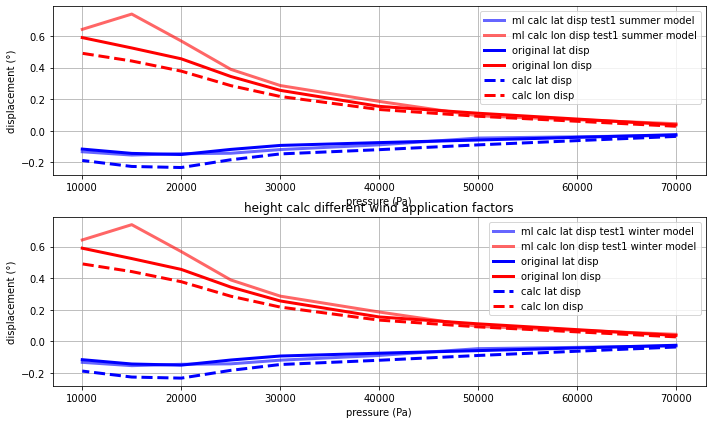

lat disp rmse:  0.016142375604701498
lon disp rmse:  0.09068525543826236
[85010.0, 69970.0, 50010.0, 40010.0, 29990.0, 25010.0, 20010.0, 15000.0, 10000.0]


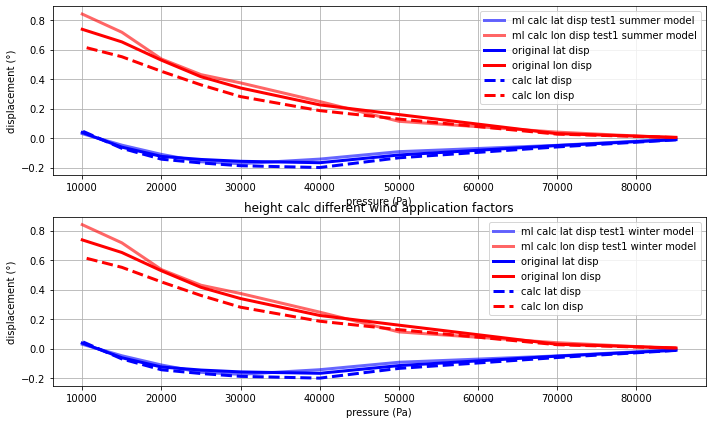

lat disp rmse:  0.0151604374233138
lon disp rmse:  0.046129321365500985
[92480.0, 85000.0, 70000.0, 49990.0, 40000.0, 30010.0, 25010.0, 20000.0, 15000.0, 10000.0]


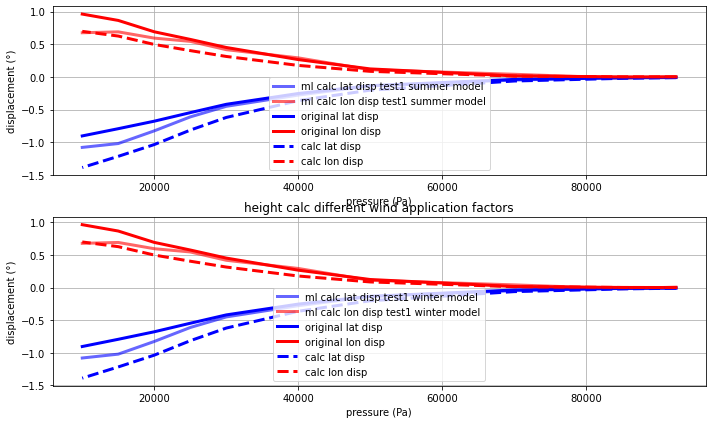

lat disp rmse:  0.10516965479892162
lon disp rmse:  0.11212474834442288
[92530.0, 85010.0, 69990.0, 49990.0, 40010.0, 30010.0, 25010.0, 20000.0, 15000.0, 10000.0]


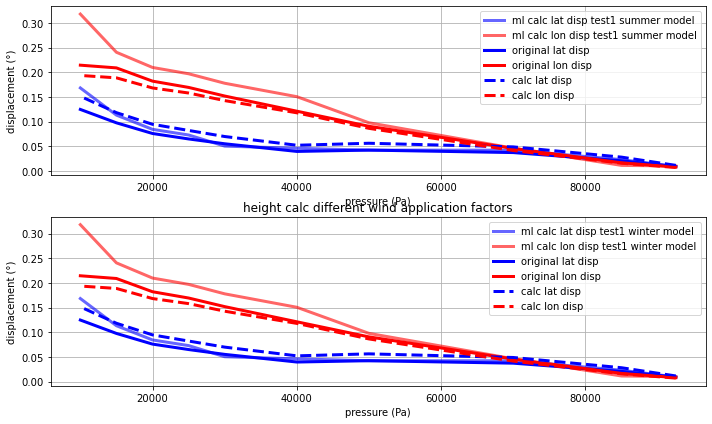

lat disp rmse:  0.015401316222442566
lon disp rmse:  0.0386018222572934
[85000.0, 69980.0, 50010.0, 40000.0, 30000.0, 25010.0, 20000.0, 15000.0, 10000.0]


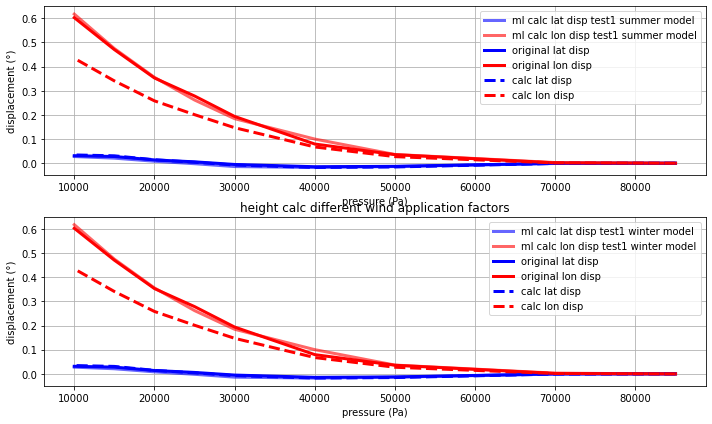

lat disp rmse:  0.005163216960256939
lon disp rmse:  0.010731405915695968
[100000.0, 92530.0, 84980.0, 69990.0, 50000.0, 40000.0, 30000.0, 25010.0, 20000.0, 15000.0, 10000.0]


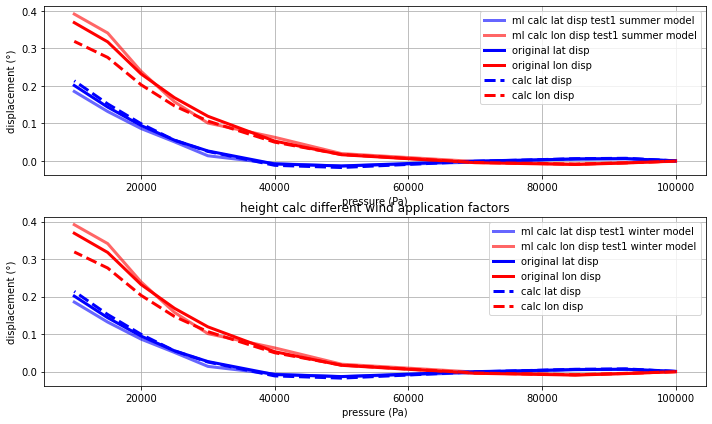

lat disp rmse:  0.007695589804778745
lon disp rmse:  0.012434143843563958
[84600.0, 70010.0, 50020.0, 39990.0, 30000.0, 25000.0, 20010.0, 15000.0, 10000.0]


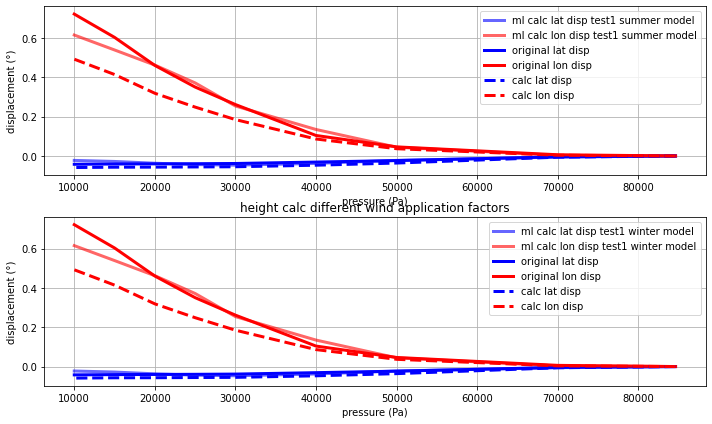

lat disp rmse:  0.0088296388003514
lon disp rmse:  0.043338030430856704
[92510.0, 85010.0, 70020.0, 49990.0, 40010.0, 30010.0, 25000.0, 20010.0, 15000.0, 10000.0]


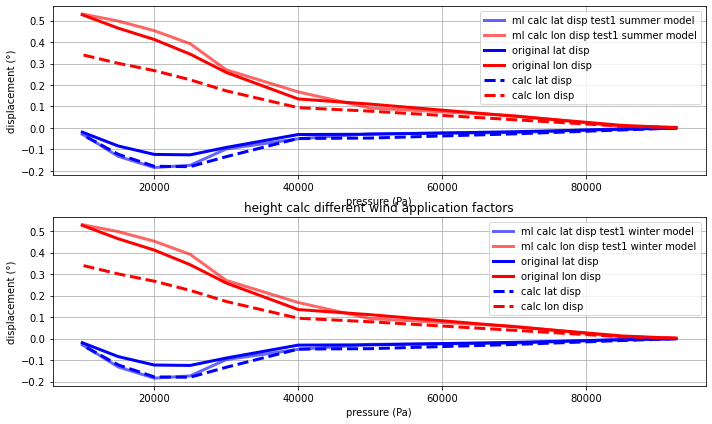

lat disp rmse:  0.029941352847470605
lon disp rmse:  0.02593351047319403
[84980.0, 70030.0, 50020.0, 40010.0, 30010.0, 24990.0, 20000.0, 15010.0, 10000.0]


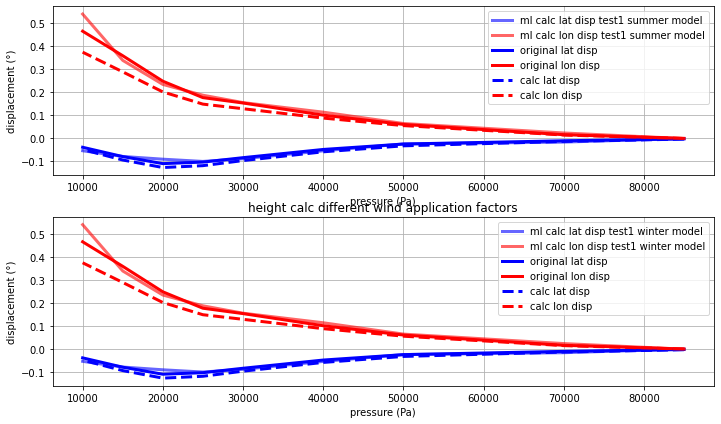

lat disp rmse:  0.008849201745261775
lon disp rmse:  0.026860413008696068
[92520.0, 84990.0, 69990.0, 50000.0, 40010.0, 30010.0, 25010.0, 20000.0, 15010.0, 10000.0]


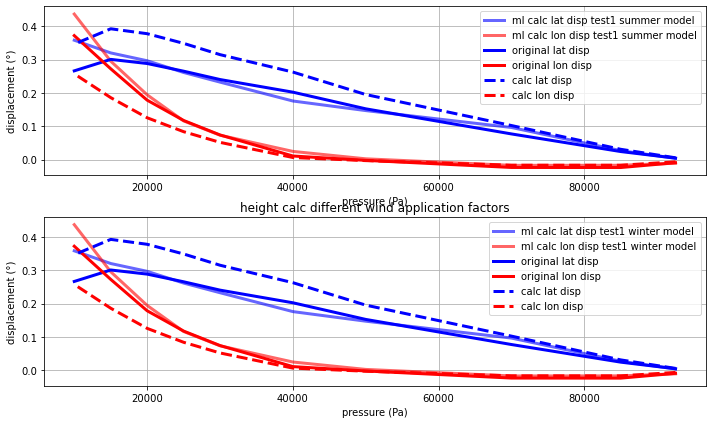

lat disp rmse:  0.031790737499229185
lon disp rmse:  0.02296021743803912
[92530.0, 85010.0, 70010.0, 49990.0, 39990.0, 30000.0, 25000.0, 20010.0, 15000.0, 10000.0]


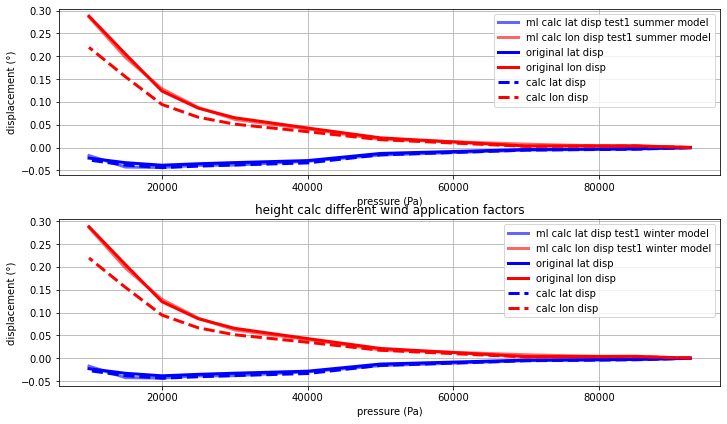

lat disp rmse:  0.004519127109140821
lon disp rmse:  0.003674335386522756
[92500.0, 85010.0, 70030.0, 50000.0, 40010.0, 30000.0, 25010.0, 20010.0, 15000.0, 10000.0]


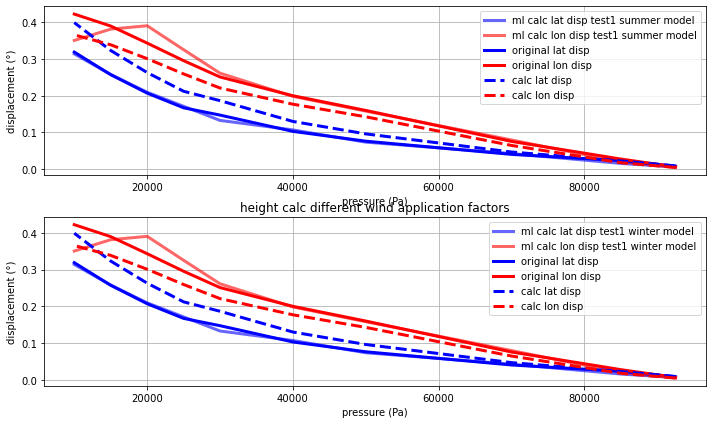

lat disp rmse:  0.005868756370190665
lon disp rmse:  0.029233488296256143
[85020.0, 69990.0, 49990.0, 39990.0, 30010.0, 25010.0, 20010.0, 15000.0, 10000.0]


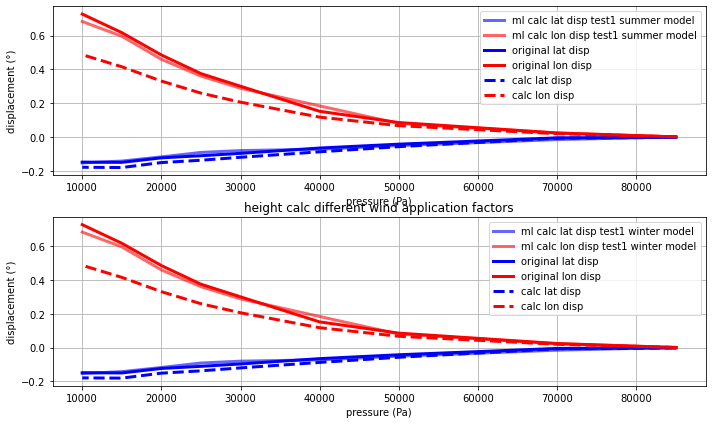

lat disp rmse:  0.010510509521275618
lon disp rmse:  0.0222112924072219
[84990.0, 70000.0, 49990.0, 39990.0, 30010.0, 25010.0, 20000.0, 15000.0, 10000.0]


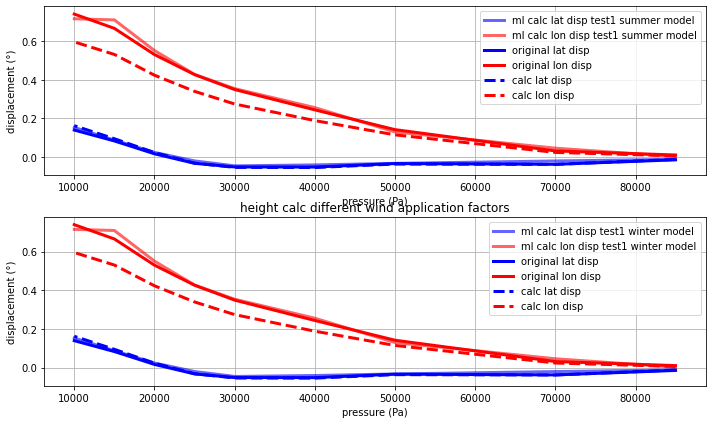

lat disp rmse:  0.009882881473765039
lon disp rmse:  0.019780325550858784
[92520.0, 85010.0, 70000.0, 50000.0, 39990.0, 30000.0, 25000.0, 20000.0, 15000.0, 10000.0]


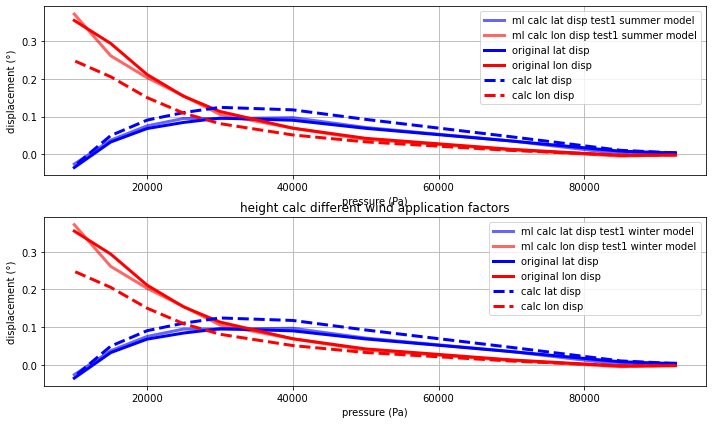

lat disp rmse:  0.006127967587967775
lon disp rmse:  0.012253921324979029
[84980.0, 69990.0, 50020.0, 40010.0, 30000.0, 25000.0, 20000.0, 15000.0, 10000.0]


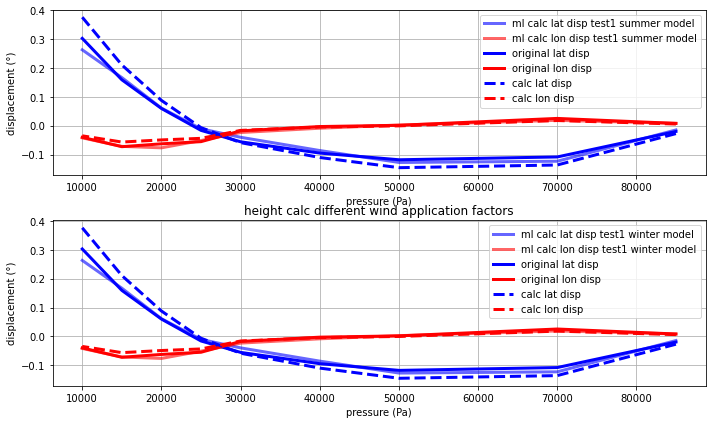

lat disp rmse:  0.016071445775299644
lon disp rmse:  0.006016774932788891
[92510.0, 85020.0, 70000.0, 49990.0, 40010.0, 30010.0, 25000.0, 20000.0, 15000.0, 10000.0]


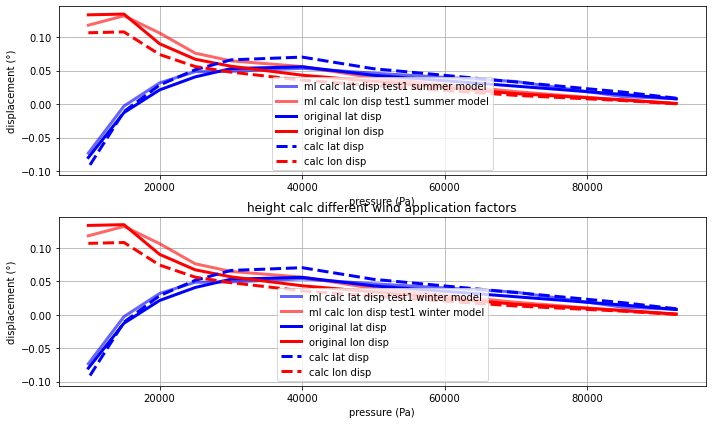

lat disp rmse:  0.006333698733193498
lon disp rmse:  0.009245178368385698
[99880.0, 92500.0, 84990.0, 70020.0, 49990.0, 40010.0, 30000.0, 25000.0, 20000.0, 15000.0, 10000.0]


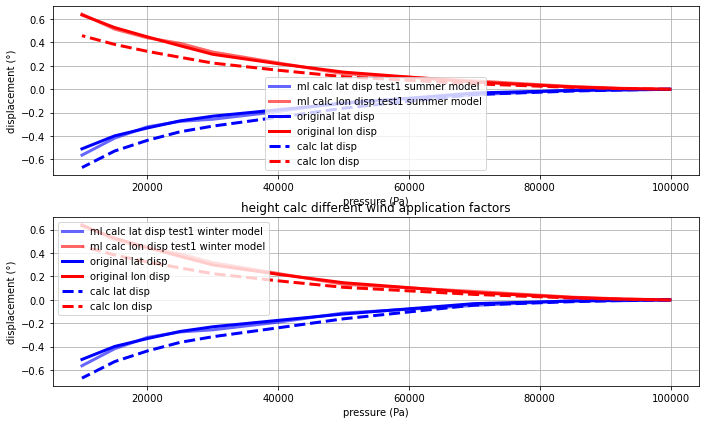

lat disp rmse:  0.020560573223349626
lon disp rmse:  0.011470726016557927
[92540.0, 84980.0, 69990.0, 49990.0, 40000.0, 30010.0, 25000.0, 20010.0, 15000.0, 10000.0]


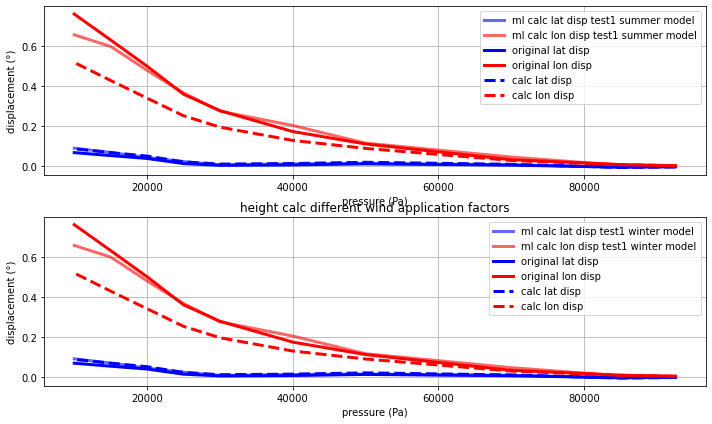

lat disp rmse:  0.009412542880515873
lon disp rmse:  0.03663586016685471
[100030.0, 92520.0, 85000.0, 70010.0, 50010.0, 40000.0, 30010.0, 25000.0, 20010.0, 15000.0, 10000.0]


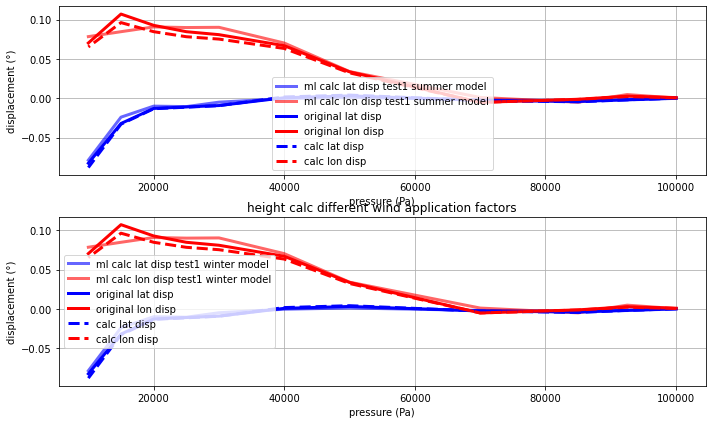

lat disp rmse:  0.003228723795967842
lon disp rmse:  0.00828548407024558
[100010.0, 92520.0, 84990.0, 69990.0, 50000.0, 40000.0, 30000.0, 25000.0, 20000.0, 15010.0, 10000.0]


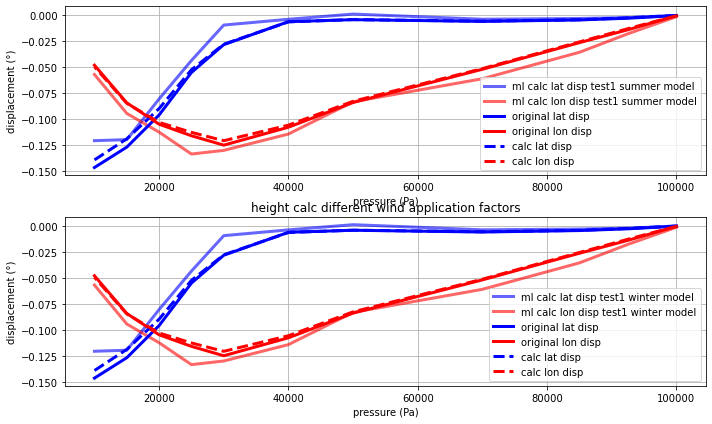

lat disp rmse:  0.011620035138167475
lon disp rmse:  0.008538363159711813
[99980.0, 92520.0, 85020.0, 70010.0, 50020.0, 40010.0, 30010.0, 25010.0, 20000.0, 15000.0, 10000.0]


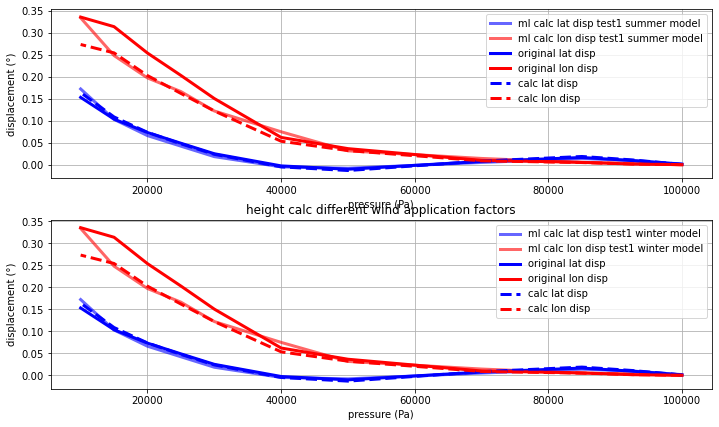

lat disp rmse:  0.006931966409364424
lon disp rmse:  0.029999714305009487
[92520.0, 84980.0, 69990.0, 50010.0, 40000.0, 30000.0, 25000.0, 20000.0, 15000.0, 10000.0]


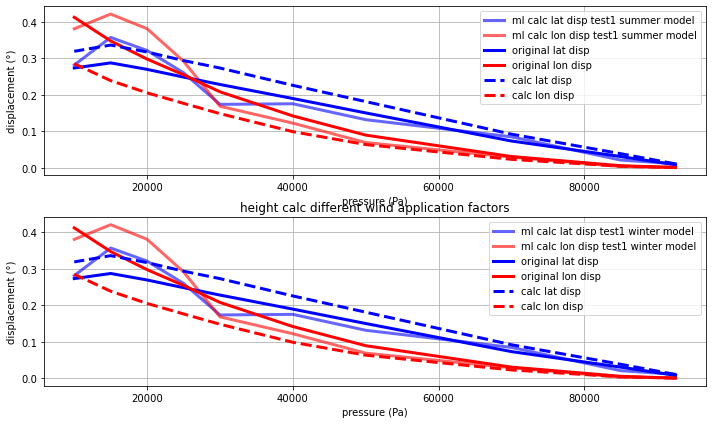

lat disp rmse:  0.03390686857323824
lon disp rmse:  0.04133513683570593
[100010.0, 92490.0, 85000.0, 70020.0, 50010.0, 40010.0, 30000.0, 25000.0, 20000.0, 15000.0, 10000.0]


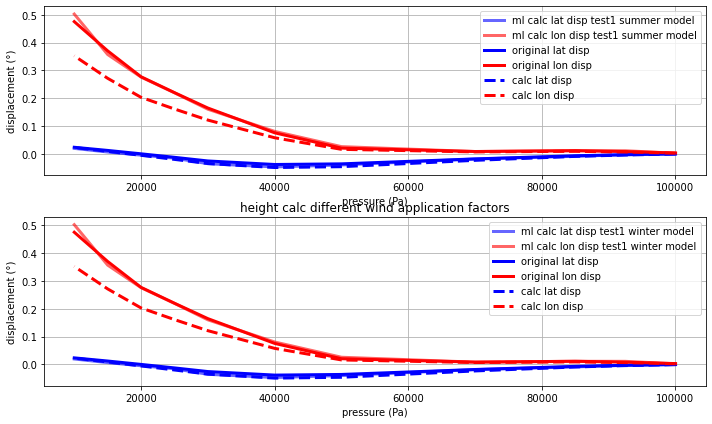

lat disp rmse:  0.005018820297635978
lon disp rmse:  0.009504189744303925
[92510.0, 84990.0, 69990.0, 50010.0, 39990.0, 30000.0, 25010.0, 20000.0, 15000.0, 10000.0]


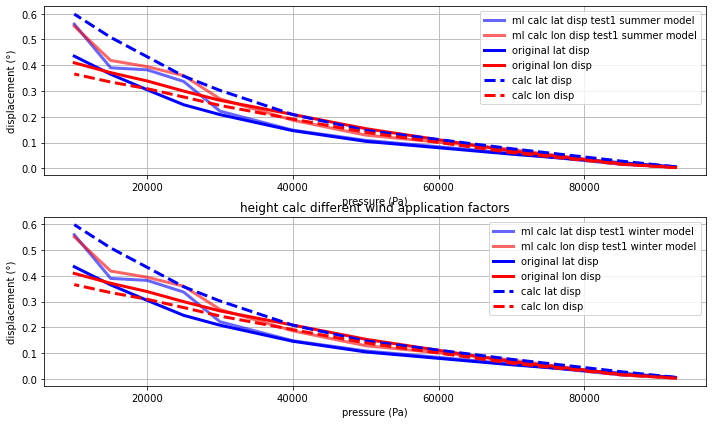

lat disp rmse:  0.05524564967549383
lon disp rmse:  0.05515002455597382
[70010.0, 50010.0, 39990.0, 30010.0, 25010.0, 20010.0, 15000.0, 10000.0]


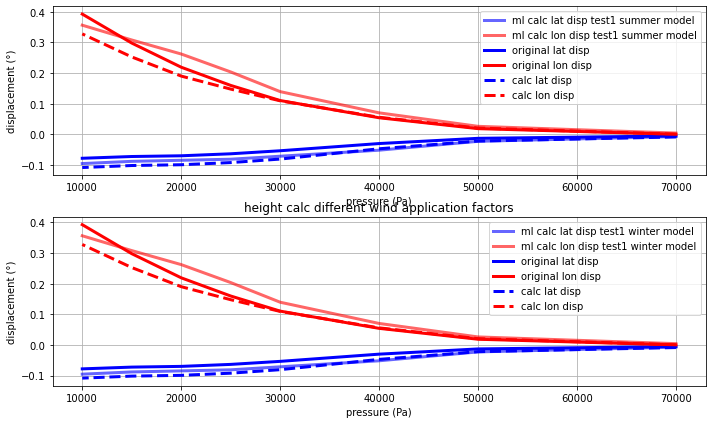

lat disp rmse:  0.015665441733937392
lon disp rmse:  0.028235525165108775
[92510.0, 84960.0, 70020.0, 49990.0, 39990.0, 30010.0, 25000.0, 20000.0, 15000.0, 10000.0]


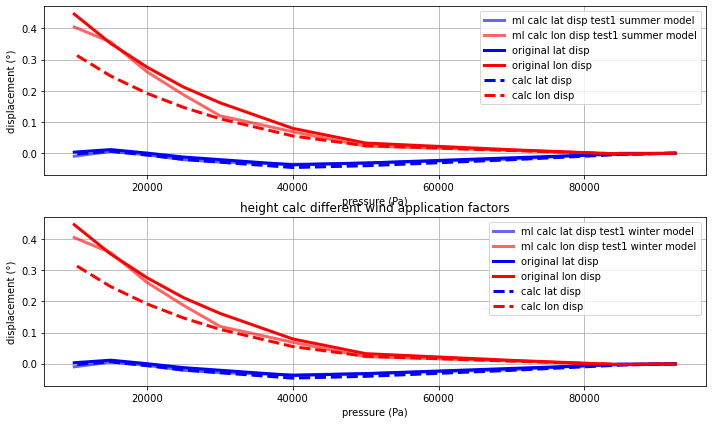

lat disp rmse:  0.006243670142714232
lon disp rmse:  0.021270045574584586
[100000.0, 92530.0, 85020.0, 69990.0, 50000.0, 40010.0, 30000.0, 25000.0, 20010.0, 15000.0, 10000.0]


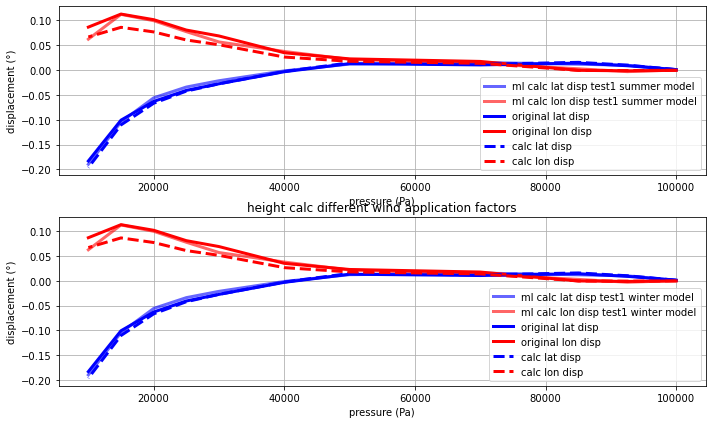

lat disp rmse:  0.0045223829500949594
lon disp rmse:  0.008488733360019998
[92500.0, 84980.0, 69980.0, 50000.0, 40010.0, 30010.0, 25000.0, 20000.0, 15000.0, 10000.0]


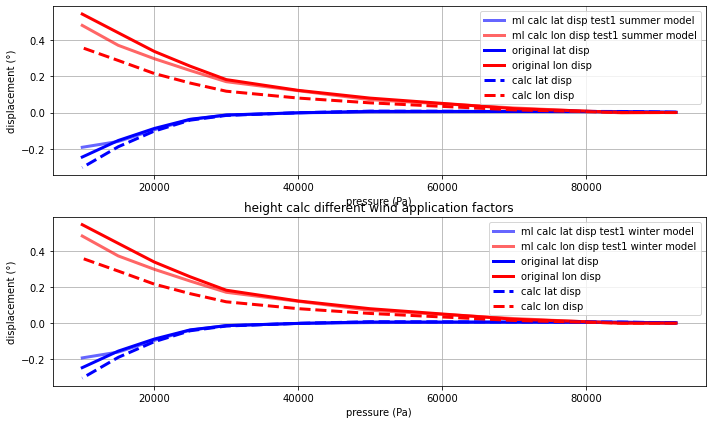

lat disp rmse:  0.01732523827117733
lon disp rmse:  0.033436625820760686
[92510.0, 85000.0, 70000.0, 50000.0, 40010.0, 30010.0, 25010.0, 20000.0, 15000.0, 10000.0]


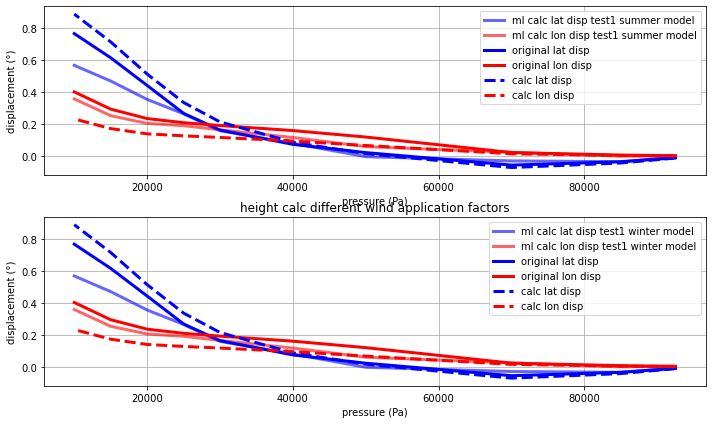

lat disp rmse:  0.08352573160938928
lon disp rmse:  0.03328686206641554
[92500.0, 85000.0, 70010.0, 49990.0, 39990.0, 30000.0, 25010.0, 20000.0, 15010.0, 10000.0]


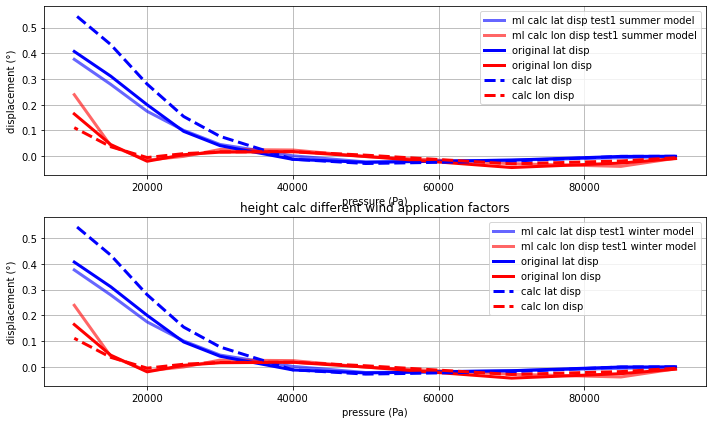

lat disp rmse:  0.016931738575642074
lon disp rmse:  0.024972895493567772
[99730.0, 92510.0, 85020.0, 69980.0, 50000.0, 40010.0, 30010.0, 25000.0, 20010.0, 15000.0, 10000.0]


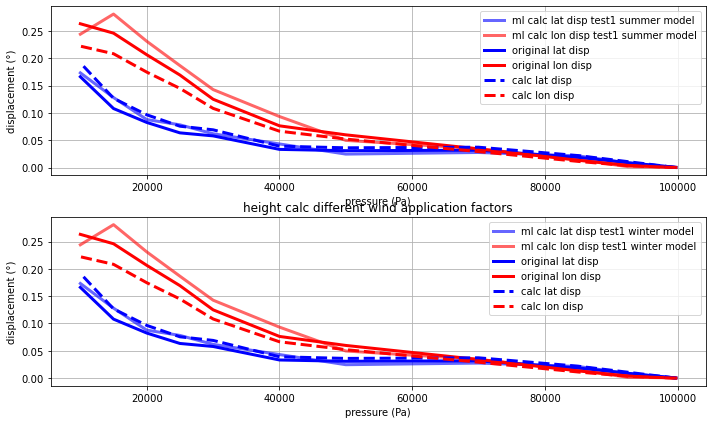

lat disp rmse:  0.008937816941978061
lon disp rmse:  0.017076962064721174
[99850.0, 92500.0, 85020.0, 70030.0, 50000.0, 40000.0, 30000.0, 25010.0, 20000.0, 15000.0, 10000.0]


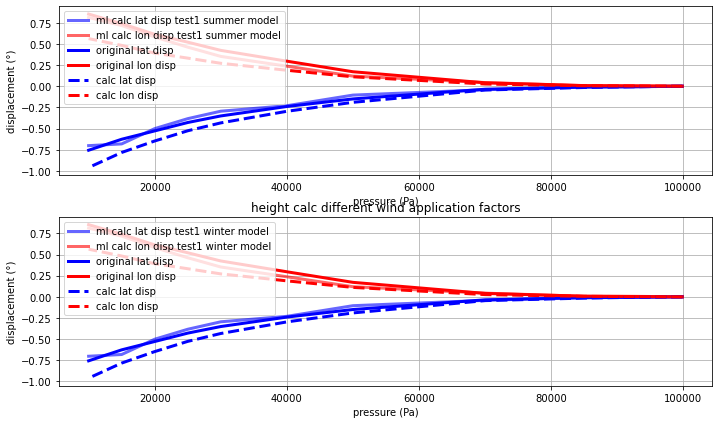

lat disp rmse:  0.035880455232249836
lon disp rmse:  0.040302382662891496
[92520.0, 85000.0, 69990.0, 49990.0, 40010.0, 30010.0, 25010.0, 20010.0, 15000.0, 10000.0]


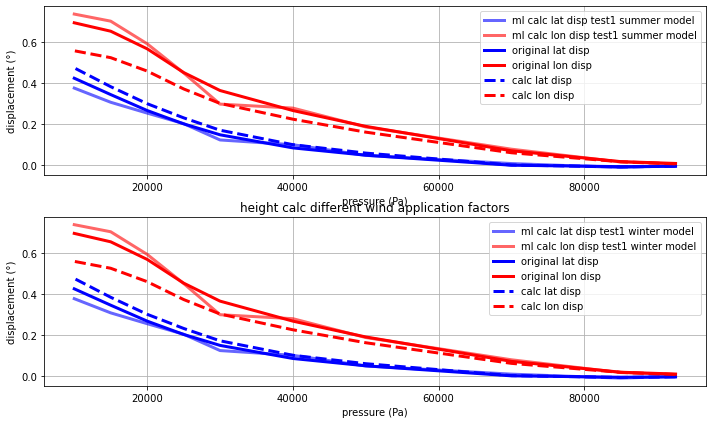

lat disp rmse:  0.02198640000142025
lon disp rmse:  0.030670344179812285
[99600.0, 92480.0, 85010.0, 69990.0, 49990.0, 39990.0, 30000.0, 25000.0, 20000.0, 15010.0, 10000.0]


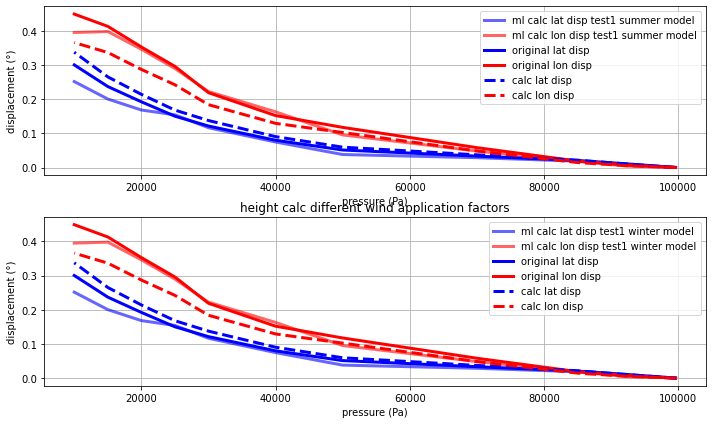

lat disp rmse:  0.02037638327029873
lon disp rmse:  0.01896450990666545
[100000.0, 92510.0, 85030.0, 69980.0, 50000.0, 40000.0, 30010.0, 25010.0, 20000.0, 15000.0, 10000.0]


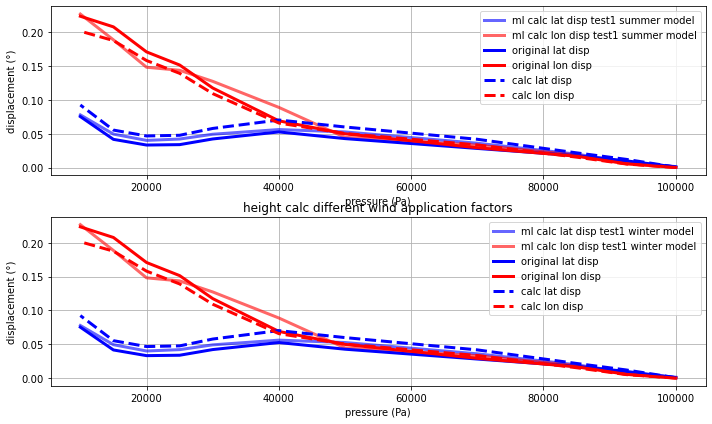

lat disp rmse:  0.006093518256180448
lon disp rmse:  0.011641492733534469
[92510.0, 84990.0, 70020.0, 49990.0, 40000.0, 30000.0, 25010.0, 20010.0, 15000.0, 10000.0]


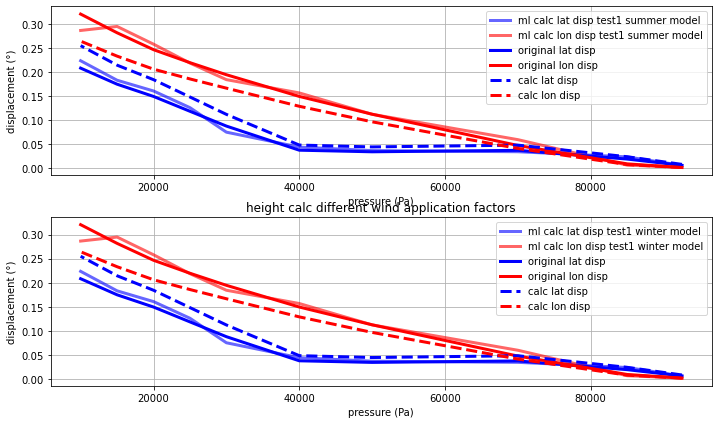

lat disp rmse:  0.008507554878591417
lon disp rmse:  0.01331759835399649
[100000.0, 92520.0, 85010.0, 70010.0, 50000.0, 40010.0, 30000.0, 25010.0, 20010.0, 15000.0, 10000.0]


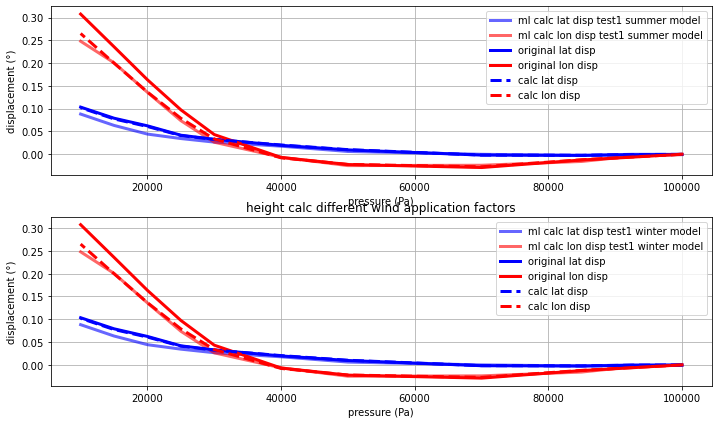

lat disp rmse:  0.009169509066639926
lon disp rmse:  0.024232210860799214
[92490.0, 85020.0, 70020.0, 50010.0, 39990.0, 30000.0, 25000.0, 20000.0, 15000.0, 10000.0]


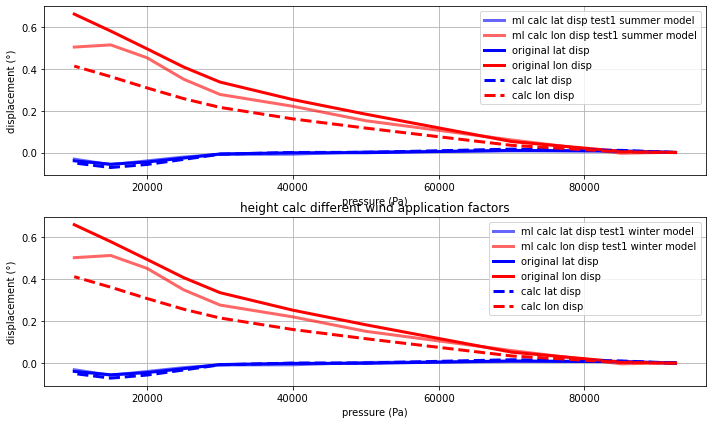

lat disp rmse:  0.004487900414743384
lon disp rmse:  0.06318132612198553
[100010.0, 92490.0, 84990.0, 70020.0, 50010.0, 39990.0, 30010.0, 25000.0, 20000.0, 15000.0, 10000.0]


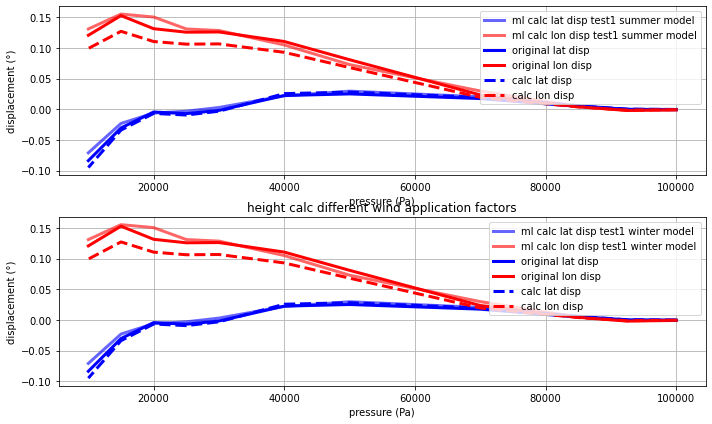

lat disp rmse:  0.005126310562690989
lon disp rmse:  0.007666125830954595
[84990.0, 70010.0, 49990.0, 40000.0, 30000.0, 25010.0, 20000.0, 15000.0, 10000.0]


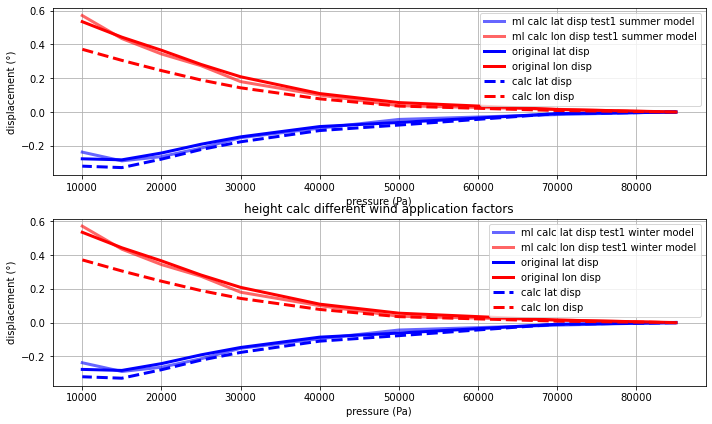

lat disp rmse:  0.018422972303898482
lon disp rmse:  0.018776685611685804
[92480.0, 85010.0, 70000.0, 50010.0, 40010.0, 30000.0, 25010.0, 20000.0, 15000.0, 10000.0]


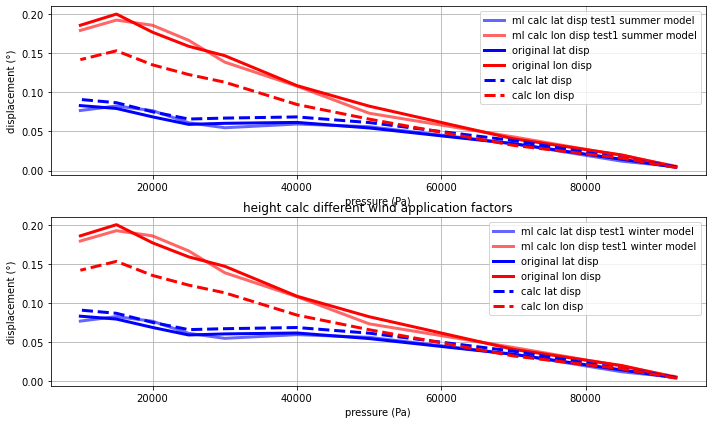

lat disp rmse:  0.004045784842251996
lon disp rmse:  0.006321988174262188
[99980.0, 92500.0, 85000.0, 70000.0, 50000.0, 40000.0, 30000.0, 25000.0, 20000.0, 15000.0, 10000.0]


ValueError: Input contains NaN, infinity or a value too large for dtype('float32').

In [37]:
from scipy.signal import savgol_filter

def find_nearest(array, value):
    array = np.asarray(array)
    idx = (np.abs(array - value)).argmin()
    return array[idx]

stdplevs = [100000,92500,85000,70000,50000,40000,30000,25000,20000,15000,10000,7000,5000,3000,2000,1000]

rmse_total_lat_1 = []
rmse_total_lat_2 = []
rmse_total_lon_1 = []
rmse_total_lon_2 = []

for i in range(len(testidx)):
    if i != 0:
#         try:
        testdata = test[testidx[i-1]:testidx[i]]
        testdata = testdata.reset_index()
        extract_plevs = []
        for j in stdplevs:
            intermediat_p = float(find_nearest(testdata.pressure, j))
            if np.abs(j - intermediat_p) < 500:
                extract_plevs.append(intermediat_p)
        print(extract_plevs)
        testdata = testdata[np.isin(testdata.pressure, extract_plevs)]
        mlout = model_dt.predict(testdata[['temperature', 'pressure', 'u', 'v', 'z','lat', 'lon' , 'calc_latd', 'calc_lond']])
        mlout_lat, mlout_lon = mlout.transpose()

        mlout_winter = model_dt_winter.predict(testdata[['temperature', 'pressure', 'u', 'v', 'z','lat', 'lon' , 'calc_latd', 'calc_lond']])
        mlout_lat_winter, mlout_lon_winter = mlout.transpose()

        fig, ax1 = maplt.subplots(2, figsize=(10, 6))
        filterlen = int(len(testdata)//2)
        if not (filterlen & 0x1):
            filterlen += 1
        ax1[0].plot(testdata.pressure,np.array(savgol_filter(mlout_lat, filterlen, 3)),color = 'blue', alpha = 0.6, label='ml calc lat disp test1 summer model')
        ax1[0].plot(testdata.pressure,np.array(savgol_filter(mlout_lon, filterlen, 3)),color = 'red',  alpha = 0.6,label='ml calc lon disp test1 summer model')
        ax1[0].plot(testdata.pressure,testdata.latd,color = 'blue', label='original lat disp')
        ax1[0].plot(testdata.pressure,testdata.lond, color = 'red', label='original lon disp')
        ax1[0].plot(testdata.pressure,testdata.calc_latd,color = 'blue',ls ='--' ,label='calc lat disp')
        ax1[0].plot(testdata.pressure,testdata.calc_lond, color = 'red',ls ='--' ,label='calc lon disp')
        ax1[0].set_xlabel('pressure (Pa)')
        ax1[0].set_ylabel('displacement (°)')
        ax1[0].tick_params(axis='y')
        ax1[0].legend()
        ax1[0].grid()

        ax1[1].plot(testdata.pressure,np.array(savgol_filter(mlout_lat_winter, filterlen, 3)),color = 'blue', alpha = 0.6, label='ml calc lat disp test1 winter model')
        ax1[1].plot(testdata.pressure,np.array(savgol_filter(mlout_lon_winter, filterlen, 3)),color = 'red',  alpha = 0.6,label='ml calc lon disp test1 winter model')
        ax1[1].plot(testdata.pressure,testdata.latd,color = 'blue', label='original lat disp')
        ax1[1].plot(testdata.pressure,testdata.lond, color = 'red', label='original lon disp')
        ax1[1].plot(testdata.pressure,testdata.calc_latd,color = 'blue',ls ='--' ,label='calc lat disp')
        ax1[1].plot(testdata.pressure,testdata.calc_lond, color = 'red',ls ='--' ,label='calc lon disp')
        ax1[1].set_xlabel('pressure (Pa)')
        ax1[1].set_ylabel('displacement (°)')
        ax1[1].tick_params(axis='y')
        ax1[1].legend()

        fig.tight_layout()  # otherwise the right y-label is slightly clipped
        maplt.title('height calc different wind application factors')
        maplt.legend()
        maplt.grid()
        maplt.show()
        maplt.close()
        rmse_total_lat_1.append(np.sqrt(np.nanmean((np.array(savgol_filter(mlout_lat, filterlen, 3))-testdata.latd)**2)))
        rmse_total_lon_1.append(np.sqrt(np.nanmean((np.array(savgol_filter(mlout_lon, filterlen, 3))-testdata.lond)**2)))
        print('lat disp rmse: ',rmse_total_lat_1[-1])
        print('lon disp rmse: ',rmse_total_lon_1[-1])
#         except:
#             pass
print('---')
print('rmse_total_lat_1: ', np.mean(rmse_total_lat_1))
print('rmse_total_lon_1: ', np.mean(rmse_total_lon_1))

In [37]:
# from scipy.signal import savgol_filter

# def find_nearest(array, value):
#     array = np.asarray(array)
#     idx = (np.abs(array - value)).argmin()
#     return array[idx]

# stdplevs = [100000,92500,85000,70000,50000,40000,30000,25000,20000,15000,10000,7000,5000,3000,2000,1000]

# rmse_total_lat_1 = []
# rmse_total_lat_2 = []
# rmse_total_lon_1 = []
# rmse_total_lon_2 = []

# for i in range(len(testidx)):
#     if i != 0:
#         try:
#             testdata = test[testidx[i-1]:testidx[i]]
#             testdata = testdata.reset_index()
#             extract_plevs = []
#             for j in stdplevs:
#                 intermediat_p = float(find_nearest(testdata.pressure, j))
#                 if np.abs(j - intermediat_p) < 500:
#                     extract_plevs.append(intermediat_p)
#             print(extract_plevs)
#             testdata = testdata[np.isin(testdata.pressure, extract_plevs)]
#             mlout = model_dt.predict(testdata[['temperature', 'pressure', 'u', 'v', 'z','lat', 'lon' , 'calc_latd', 'calc_lond']])
#             mlout_lat, mlout_lon = mlout.transpose()

#             mlout_wo_coords = model_dt_wo_coords.predict(testdata[['temperature', 'pressure', 'u', 'v', 'z', 'calc_latd', 'calc_lond']])
#             mlout_lat_wo_coords, mlout_lon_wo_coords = mlout_wo_coords.transpose()

#             fig, ax1 = maplt.subplots(figsize=(10, 6))
#             filterlen = int(len(testdata)//2)
#             if not (filterlen & 0x1):
#                 filterlen += 1
#             ax1.plot(testdata.pressure,np.array(savgol_filter(mlout_lat, filterlen, 3)),color = 'blue', alpha = 0.6, label='ml calc lat disp test1')
#             ax1.plot(testdata.pressure,np.array(savgol_filter(mlout_lon, filterlen, 3)),color = 'red',  alpha = 0.6,label='ml calc lon disp test1')
#             ax1.plot(testdata.pressure,np.array(savgol_filter(mlout_lat_wo_coords, filterlen, 3)),color = 'green', alpha = 0.5, label='ml calc lat disp test1 w/o coords')
#             ax1.plot(testdata.pressure,np.array(savgol_filter(mlout_lon_wo_coords, filterlen, 3)),color = 'orange',  alpha = 0.5,label='ml calc lon disp test1 w/o coords')
#             ax1.plot(testdata.pressure,testdata.latd,color = 'blue', label='original lat disp')
#             ax1.plot(testdata.pressure,testdata.lond, color = 'red', label='original lon disp')
#             ax1.plot(testdata.pressure,testdata.calc_latd,color = 'blue',ls ='--' ,label='calc lat disp')
#             ax1.plot(testdata.pressure,testdata.calc_lond, color = 'red',ls ='--' ,label='calc lon disp')
#             ax1.set_xlabel('pressure (Pa)')
#             ax1.set_ylabel('displacement (°)')
#             ax1.tick_params(axis='y')

#             fig.tight_layout()  # otherwise the right y-label is slightly clipped
#             maplt.title('height calc different wind application factors')
#             maplt.legend()
#             maplt.grid()
#             maplt.show()
#             maplt.close()
#             rmse_total_lat_1.append(np.sqrt(np.nanmean((np.array(savgol_filter(mlout_lat, filterlen, 3))-testdata.latd)**2)))
#             rmse_total_lon_1.append(np.sqrt(np.nanmean((np.array(savgol_filter(mlout_lon, filterlen, 3))-testdata.lond)**2)))
#             print('lat disp rmse: ',rmse_total_lat_1[-1])
#             print('lon disp rmse: ',rmse_total_lon_1[-1])
#             rmse_total_lat_2.append(np.sqrt(np.nanmean((np.array(savgol_filter(mlout_lat_wo_coords, filterlen, 3))-testdata.latd)**2)))
#             rmse_total_lon_2.append(np.sqrt(np.nanmean((np.array(savgol_filter(mlout_lon_wo_coords, filterlen, 3))-testdata.lond)**2)))
#             print('lat disp rmse w/o coords: ',rmse_total_lat_2[-1])
#             print('lon disp rmse w/o coords: ',rmse_total_lon_2[-1])
#         except:
#             pass
# print('---')
# print('rmse_total_lat_1: ', np.mean(rmse_total_lat_1))
# print('rmse_total_lon_1: ', np.mean(rmse_total_lon_1))
# print('rmse_total_lat_2: ', np.mean(rmse_total_lat_2))
# print('rmse_total_lon_2: ', np.mean(rmse_total_lon_2))

In [36]:
testdata

,index,temperature,pressure,u,v,latd,lond,lat,lon,calc_latd,calc_lond,z,u_shear,v_shear
9,3133224,289.11,92490.0,0.919239,0.919239,-0.00033,-0.00024,36.05,-115.18,-0.000106,-0.000066,767.526321,0.027465,0.116282
145,3133360,284.41,85010.0,0.496147,-1.730271,-0.00052,0.00104,36.05,-115.18,-0.000512,0.001015,1475.035575,0.000000,0.000000
462,3133677,271.83,70020.0,2.838767,-7.799449,-0.00482,0.02252,36.05,-115.18,-0.005645,0.018264,3053.255490,0.000000,0.000000
949,3134164,252.14,49990.0,4.649700,-10.954008,-0.02254,0.07093,36.05,-115.18,-0.028911,0.059703,5640.915499,0.000000,0.000000
1281,3134496,239.08,40000.0,7.934518,-16.268172,-0.04560,0.11670,36.05,-115.18,-0.056146,0.095139,7243.442313,0.000000,0.000000
1732,3134947,224.93,30000.0,16.113212,-15.560347,-0.08957,0.19525,36.05,-115.18,-0.103298,0.150156,9192.681802,0.071934,-0.069466
1997,3135212,220.31,25010.0,25.534357,-17.223141,-0.13392,0.24577,36.05,-115.18,-0.152714,0.187171,10380.334482,-0.082904,0.055919
2290,3135505,222.25,20000.0,13.700226,-20.311421,-0.18421,0.31147,36.05,-115.18,-0.213867,0.239816,11824.466987,-0.111839,0.165808
2683,3135898,223.71,15000.0,1.679984,-32.056008,-0.19089,0.43647,36.05,-115.18,-0.223203,0.334460,13706.915945,0.000000,0.000000
3137,3136352,211.34,10000.0,-7.571060,-12.600359,-0.17393,0.53949,36.05,-115.18,-0.201381,0.421139,16279.895489,-0.271060,0.043612


In [32]:
# from scipy.signal import savgol_filter

# rmse_total_lat_1 = []
# rmse_total_lat_2 = []
# rmse_total_lon_1 = []
# rmse_total_lon_2 = []

# for i in range(len(testidx)):
#     if i != 0:
#         testdata = test[testidx[i-1]:testidx[i]]
#         mlout = model_dt.predict(testdata[['temperature', 'pressure', 'u', 'v', 'z','lat', 'lon' , 'calc_latd', 'calc_lond']])
#         mlout_lat, mlout_lon = mlout.transpose()
        
#         mlout_wo_coords = model_dt_wo_coords.predict(testdata[['temperature', 'pressure', 'u', 'v', 'z', 'calc_latd', 'calc_lond']])
#         mlout_lat_wo_coords, mlout_lon_wo_coords = mlout_wo_coords.transpose()

#         fig, ax1 = maplt.subplots(figsize=(10, 6))
#         ax1.plot(testdata.pressure,np.array(savgol_filter(mlout_lat, 1111, 3)),color = 'blue', alpha = 0.6, label='ml calc lat disp test1')
#         ax1.plot(testdata.pressure,np.array(savgol_filter(mlout_lon, 1111, 3)),color = 'red',  alpha = 0.6,label='ml calc lon disp test1')
#         ax1.plot(testdata.pressure,np.array(savgol_filter(mlout_lat_wo_coords, 1111, 3)),color = 'green', alpha = 0.5, label='ml calc lat disp test1 w/o coords')
#         ax1.plot(testdata.pressure,np.array(savgol_filter(mlout_lon_wo_coords, 1111, 3)),color = 'orange',  alpha = 0.5,label='ml calc lon disp test1 w/o coords')
#         ax1.plot(testdata.pressure,testdata.latd,color = 'blue', label='original lat disp')
#         ax1.plot(testdata.pressure,testdata.lond, color = 'red', label='original lon disp')
#         ax1.plot(testdata.pressure,testdata.calc_latd,color = 'blue',ls ='--' ,label='calc lat disp')
#         ax1.plot(testdata.pressure,testdata.calc_lond, color = 'red',ls ='--' ,label='calc lon disp')
#         ax1.set_xlabel('pressure (Pa)')
#         ax1.set_ylabel('displacement (°)')
#         ax1.tick_params(axis='y')

#         fig.tight_layout()  # otherwise the right y-label is slightly clipped
#         maplt.title('height calc different wind application factors')
#         maplt.legend()
#         maplt.grid()
#         maplt.show()
#         maplt.close()
#         rmse_total_lat_1.append(np.sqrt(np.nanmean((np.array(savgol_filter(mlout_lat, 1111, 3))-testdata.latd)**2)))
#         rmse_total_lon_1.append(np.sqrt(np.nanmean((np.array(savgol_filter(mlout_lon, 1111, 3))-testdata.lond)**2)))
#         print('lat disp rmse: ',rmse_total_lat_1[-1])
#         print('lon disp rmse: ',rmse_total_lon_1[-1])
#         rmse_total_lat_2.append(np.sqrt(np.nanmean((np.array(savgol_filter(mlout_lat_wo_coords, 1111, 3))-testdata.latd)**2)))
#         rmse_total_lon_2.append(np.sqrt(np.nanmean((np.array(savgol_filter(mlout_lon_wo_coords, 1111, 3))-testdata.lond)**2)))
#         print('lat disp rmse w/o coords: ',rmse_total_lat_2[-1])
#         print('lon disp rmse w/o coords: ',rmse_total_lon_2[-1])
# print('---')
# print('rmse_total_lat_1: ', np.mean(rmse_total_lat_1))
# print('rmse_total_lon_1: ', np.mean(rmse_total_lon_1))
# print('rmse_total_lat_2: ', np.mean(rmse_total_lat_2))
# print('rmse_total_lon_2: ', np.mean(rmse_total_lon_2))

In [ ]:
model_dt = DecisionTreeRegressor()
model_dt.fit(train[['temperature', 'pressure', 'u', 'v', 'z','lat', 'lon' , 'calc_latd', 'calc_lond']], train[['latd', 'lond']])

model_dt_wo_coords = DecisionTreeRegressor()
model_dt_wo_coords.fit(train[['temperature', 'pressure', 'u', 'v', 'z','calc_latd', 'calc_lond']], train[['latd', 'lond']])

In [31]:
# for i in range(len(testidx)):
#     if i != 0:
#         testdata = test[testidx[i-1]:testidx[i]]
#         mlout = model_dt.predict(testdata[['temperature', 'pressure', 'u', 'v', 'z','lat', 'lon' , 'calc_latd', 'calc_lond']])
#         mlout_lat, mlout_lon = mlout.transpose()
        
#         mlout_wo_coords = model_dt_wo_coords.predict(testdata[['temperature', 'pressure', 'u', 'v', 'z', 'calc_latd', 'calc_lond']])
#         mlout_lat_wo_coords, mlout_lon_wo_coords = mlout_wo_coords.transpose()

#         fig, ax1 = maplt.subplots(figsize=(10, 6))
#         ax1.plot(testdata.pressure,np.array(mlout_lat),color = 'blue', alpha = 0.3, label='ml calc lat disp test1')
#         ax1.plot(testdata.pressure,np.array(mlout_lon),color = 'red',  alpha = 0.3,label='ml calc lon disp test1')
#         ax1.plot(testdata.pressure,np.array(mlout_lat_wo_coords),color = 'green', alpha = 0.5, label='ml calc lat disp test1 w/o coords')
#         ax1.plot(testdata.pressure,np.array(mlout_lon_wo_coords),color = 'orange',  alpha = 0.5,label='ml calc lon disp test1 w/o coords')
#         ax1.plot(testdata.pressure,testdata.latd,color = 'blue', label='original lat disp')
#         ax1.plot(testdata.pressure,testdata.lond, color = 'red', label='original lon disp')
#         ax1.plot(testdata.pressure,testdata.calc_latd,color = 'blue',ls ='--' ,label='calc lat disp')
#         ax1.plot(testdata.pressure,testdata.calc_lond, color = 'red',ls ='--' ,label='calc lon disp')
#         ax1.set_xlabel('pressure (Pa)')
#         ax1.set_ylabel('displacement (°)')
#         ax1.tick_params(axis='y')

#         fig.tight_layout()  # otherwise the right y-label is slightly clipped
#         maplt.title('height calc different wind application factors')
#         maplt.legend()
#         maplt.grid()
#         maplt.show()
#         maplt.close()

In [ ]:
# model_rf = RandomForestRegressor(n_estimators=100,
#                                  max_depth=10, 
#                                  random_state=0,
#                                  bootstrap=True,
#                                  max_samples=0.965,
#                              )
# model_rf.fit(train[['temperature', 'pressure', 'u', 'v', 'z']], train[['latd', 'lond']])
# mlout = model_rf.predict(testdata[['temperature', 'pressure', 'u', 'v', 'z']])
# mlout_lat, mlout_lon = mlout.transpose()

# fig, ax1 = maplt.subplots()
# ax1.plot(testdata.pressure,np.array(mlout_lat),color = 'blue', label='ml calc lat disp test1')
# ax1.plot(testdata.pressure,np.array(mlout_lon),color = 'red', label='ml calc lon disp test1')
# ax1.plot(testdata.pressure,testdata.latd,color = 'blue', alpha = 0.3, label='original lat disp')
# ax1.plot(testdata.pressure,testdata.lond, color = 'red', alpha = 0.3, label='original lon disp')
# ax1.set_xlabel('pressure (Pa)')
# ax1.set_ylabel('displacement (°)')
# ax1.tick_params(axis='y')

# fig.tight_layout()  # otherwise the right y-label is slightly clipped
# maplt.title('height calc different wind application factors')
# maplt.legend()
# maplt.grid()
# maplt.show()
# maplt.close()

---
---